# Overview

Clustering is an unsupervised learning method whose task is to divide the population or data points into a number of groups, such that data points in a group are more similar to other data points in the same group and dissimilar to the data points in other groups. It is basically a collection of objects based on similarity and dissimilarity between them.

K-means clustering is a type of unsupervised learning, which is used when you have unlabeled data (i.e., data without defined categories or groups). The goal of this algorithm is to find groups in the data, with the number of groups represented by the variable K. Given the fact that the dataset provided for Categorical Feature Encoding have 100% categorical variables, we are performing the kmeans clustering analysis by employing two different encoding techniques, viz, one hot encoding and similarity encoding of the image_name feature.

In this notebook, we explore the distribution of image_name repos for differenct cluster_id based on its frequency of its occurance in a cluster_id and also based on excluding the frequency of occurance in a cluster_id. We approach clustering, by two different encoding techniques, i.e, `One Hot Encoding` and ` Similarity Encoding`.

# Importing Packages

In [1]:
import io
import boto3
import pandas as pd
import numpy as np
import warnings
import os
import matplotlib.pyplot as plt
import plotly.express as px

from dirty_cat import SimilarityEncoder
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from tqdm import tqdm

from dotenv import load_dotenv, find_dotenv

In [2]:
%matplotlib inline
load_dotenv(find_dotenv())
warnings.filterwarnings("ignore")

pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)

In [3]:
# CEPH Bucket variables
s3_endpoint_url = os.getenv("S3_ENDPOINT")
s3_access_key = os.getenv("S3_ACCESS_KEY")
s3_secret_key = os.getenv("S3_SECRET_KEY")
s3_bucket = os.getenv("S3_BUCKET")

# s3 resource to communicate with storage
s3 = boto3.resource(
    "s3",
    endpoint_url=s3_endpoint_url,
    aws_access_key_id=s3_access_key,
    aws_secret_access_key=s3_secret_key,
)

# access the parquet file as an s3 object

obj1 = s3.Object(
    "DH-PLAYPEN", "ccx/fingerprinting/image_layers/date=2021-05-12/2021-05-12.parquet"
)
obj2 = s3.Object(
    "DH-PLAYPEN", "ccx/fingerprinting/containers/date=2021-05-12/2021-05-12.parquet"
)
obj3 = s3.Object(
    "DH-PLAYPEN", "ccx/fingerprinting/image_layers/dataframe_image_id.parquet"
)
obj4 = s3.Object("DH-PLAYPEN", "ccx/fingerprinting/containers/df_cont_image_id.parquet")
# download the file into the buffer
buffer1 = io.BytesIO()
obj1.download_fileobj(buffer1)
buffer2 = io.BytesIO()
obj2.download_fileobj(buffer2)
buffer3 = io.BytesIO()
obj3.download_fileobj(buffer3)
buffer4 = io.BytesIO()
obj4.download_fileobj(buffer4)

# read the buffer and create the dataframe
image_layers_df = pd.read_parquet(buffer1)
image_id_map = pd.read_parquet(buffer3)
containers_df = pd.read_parquet(buffer2)
cont_id_map = pd.read_parquet(buffer4)

We now have the four sets of dataframe,

- Image layer dataset (_*image_layers_df*_)
- Product name mapping for sha's of image_id from image layer dataset (_*image_id_mapping*_)
- Containers dataset (_*containers_df*_)
- Product name mapping for sha's of the image_id from container dataset (_*cont_imageid_map*_)

**Image layer Dataset**

In [4]:
image_layers_df.head()

,cluster_id,image_id,layer_image_id,layer_image_level,first_command,first_arg,archive_path
0,00003d61-9db1-4757-9cd1-84df271daeb9,sha256:337c22cabe530213b14965f9ea69a92dbeb5104...,sha256:9ebb302e1fb002fb643091710dac46f8258781d...,0,icTsn2s_EIax,2v1NneeWoS_9,archives/compressed/00/00003d61-9db1-4757-9cd1...
1,00003d61-9db1-4757-9cd1-84df271daeb9,sha256:337c22cabe530213b14965f9ea69a92dbeb5104...,sha256:a74396a32e85c2feeedf76052ed3297859810c8...,1,icTsn2s_EIax,2v1NneeWoS_9,archives/compressed/00/00003d61-9db1-4757-9cd1...
2,00003d61-9db1-4757-9cd1-84df271daeb9,sha256:337c22cabe530213b14965f9ea69a92dbeb5104...,sha256:7db62383a7470afbacfc0fab55d5a182e3c5fa2...,2,icTsn2s_EIax,2v1NneeWoS_9,archives/compressed/00/00003d61-9db1-4757-9cd1...
3,00003d61-9db1-4757-9cd1-84df271daeb9,sha256:337c22cabe530213b14965f9ea69a92dbeb5104...,sha256:f24250419f728db23957454976d6d38b679a349...,3,icTsn2s_EIax,2v1NneeWoS_9,archives/compressed/00/00003d61-9db1-4757-9cd1...
4,00003d61-9db1-4757-9cd1-84df271daeb9,sha256:337c22cabe530213b14965f9ea69a92dbeb5104...,sha256:267f7bb0f5dcf1b83f8ce89831d05f3a44a3abe...,4,icTsn2s_EIax,2v1NneeWoS_9,archives/compressed/00/00003d61-9db1-4757-9cd1...


In [5]:
image_id_map.head()

,License,architecture,build-date,com.redhat.build-host,com.redhat.component,com.redhat.license_terms,description,distribution-scope,io.k8s.description,io.k8s.display-name,io.openshift.build.commit.id,io.openshift.build.commit.url,io.openshift.build.source-location,io.openshift.expose-services,io.openshift.maintainer.component,io.openshift.maintainer.product,io.openshift.tags,maintainer,name,release,summary,url,vcs-ref,vcs-type,vendor,version,io.openshift.s2i.scripts-url,io.s2i.scripts-url,usage,io.openshift.s2i.assemble-user,authoritative-source-url,io.fabric8.s2i.version.jolokia,org.concrt.version,org.jboss.product,org.jboss.product.amq.version,org.jboss.product.openjdk.version,org.jboss.product.version,com.redhat.deployments-dir,com.redhat.dev-mode,io.jenkins.version
image_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
sha256:337c22cabe530213b14965f9ea69a92dbeb5104f79b00fd7861db7057a9e05ae,GPLv2+,x86_64,2021-04-30T00:31:42.349887,cpt-1004.osbs.prod.upshift.rdu2.redhat.com,ose-cli-artifacts-container,https://www.redhat.com/agreements,"OpenShift is a platform for developing, buildi...",public,"OpenShift is a platform for developing, buildi...",OpenShift Clients,a765590e1b87b014b9d81f9ea534460d6dff73f2,https://github.com/openshift/oc/commit/a765590...,https://github.com/openshift/oc,,oc,OpenShift Container Platform,"openshift,cli","Red Hat, Inc.",openshift/ose-cli-artifacts,202104292348.p0,Provides the latest release of Red Hat Univers...,https://access.redhat.com/containers/#/registr...,43f412b2932a5ecfe5ebedcab38cf2915cf03813,git,"Red Hat, Inc.",v4.8.0,None,None,None,None,None,None,None,None,None,None,None,None,None,None
sha256:3574d6c1fcc46e1ebd41b7b887b92035ea18213133c06edad539cde25b767ff9,GPLv2+,x86_64,2021-04-30T00:22:29.539443,cpt-1008.osbs.prod.upshift.rdu2.redhat.com,openshift-enterprise-cli-container,https://www.redhat.com/agreements,"OpenShift is a platform for developing, buildi...",public,"OpenShift is a platform for developing, buildi...",OpenShift Client,a765590e1b87b014b9d81f9ea534460d6dff73f2,https://github.com/openshift/oc/commit/a765590...,https://github.com/openshift/oc,,oc,OpenShift Container Platform,"openshift,cli","Red Hat, Inc.",openshift/ose-cli,202104292348.p0,Provides the latest release of Red Hat Univers...,https://access.redhat.com/containers/#/registr...,d3ae20f4e2fac18ea671cf12636d16791146a460,git,"Red Hat, Inc.",v4.8.0,None,None,None,None,None,None,None,None,None,None,None,None,None,None
sha256:c588b4653ef037b1300f9692b986cbeac5dfe5e66f6605ca13e0565202e8fe02,GPLv2+,x86_64,2021-05-04T21:53:04.228477,cpt-1005.osbs.prod.upshift.rdu2.redhat.com,golang-github-openshift-oauth-proxy-container,https://www.redhat.com/agreements,OpenShift OAuth Proxy.,public,OpenShift OAuth Proxy.,OpenShift OAuth Proxy,4bd4705011c19a7556551c9a1dfaaa5eacc7898c,https://github.com/openshift/oauth-proxy/commi...,https://github.com/openshift/oauth-proxy,,Release,OpenShift Container Platform,oauth,"Red Hat, Inc.",openshift/ose-oauth-proxy,202105042126.p0,Provides the latest release of Red Hat Univers...,https://access.redhat.com/containers/#/registr...,6f8aceb12953fba6382c52a2a99200bcab6c6f6b,git,"Red Hat, Inc.",v4.8.0,None,None,None,None,None,None,None,None,None,None,None,None,None,None
sha256:7b879d0179b96fe682a186af60836e4091f1fd3148d4cc5e9b10b3fc65bd2900,GPLv2+,x86_64,2021-04-29T23:09:36.775464,cpt-1008.osbs.prod.upshift.rdu2.redhat.com,golang-github-openshift-oauth-proxy-container,https://www.redhat.com/agreements,OpenShift OAuth Proxy.,public,OpenShift OAuth Proxy.,OpenShift OAuth Proxy,4bd4705011c19a7556551c9a1dfaaa5eacc7898c,https://github.com/openshift/oauth-proxy/commi...,https://github.com/openshift/oauth-proxy,,Release,OpenShift Container Platform,oauth,"Red Hat, Inc.",openshift/ose-oauth-proxy,202104292205.p0,Provides the latest release of Red Hat Univers...,https://access.redhat.com/containers/#/registr...,1bbf5dd3c77a259d830eb5182c2f5cf0f6431a20,git,"Red Hat, Inc.",v4.8.0,None,None,None,None,None,None,None,None,None,

We include only `name` column from the mapped dataset for further analysis.

In [6]:
image_id_map = image_id_map.reset_index()
image_id_map = image_id_map[["image_id", "name"]]
image_id_map.head()

,image_id,name
0,sha256:337c22cabe530213b14965f9ea69a92dbeb5104...,openshift/ose-cli-artifacts
1,sha256:3574d6c1fcc46e1ebd41b7b887b92035ea18213...,openshift/ose-cli
2,sha256:c588b4653ef037b1300f9692b986cbeac5dfe5e...,openshift/ose-oauth-proxy
3,sha256:7b879d0179b96fe682a186af60836e4091f1fd3...,openshift/ose-oauth-proxy
4,sha256:85a79d95924e4a76b1a6ccd974b2c99df349f07...,openshift/ose-oauth-proxy


**Container dataset**

In [7]:
containers_df.head()

,cluster_id,namespace,shape,shape_instances,image_id,first_command,first_arg,init_container,archive_path
0,00003d61-9db1-4757-9cd1-84df271daeb9,0LiT6ZNtbpYL,sha256:3ecf29979b2722bf4a82a5e7a954e8685820720...,1,sha256:f46f210d6023bec16e68340b484a8881ce46d5e...,None,47DEQpj8HBSa,False,archives/compressed/00/00003d61-9db1-4757-9cd1...
1,00003d61-9db1-4757-9cd1-84df271daeb9,0LiT6ZNtbpYL,sha256:3ecf29979b2722bf4a82a5e7a954e8685820720...,1,sha256:edb9aaacf421c6dc45b20324e8699cec02f26bf...,n9CdwzVF-cwZ,RNOaw_AuQeIY,False,archives/compressed/00/00003d61-9db1-4757-9cd1...
2,00003d61-9db1-4757-9cd1-84df271daeb9,0LiT6ZNtbpYL,sha256:542d007d13008cc1be2dbf03601b954c4452947...,1,sha256:a693c315b775c693dc49c19b7f217762676bc28...,b51B0EZ1bw3c,ua-xlwwsvdYd,False,archives/compressed/00/00003d61-9db1-4757-9cd1...
3,00003d61-9db1-4757-9cd1-84df271daeb9,0LiT6ZNtbpYL,sha256:542d007d13008cc1be2dbf03601b954c4452947...,1,sha256:a693c315b775c693dc49c19b7f217762676bc28...,Cl6kTzfbYztA,None,True,archives/compressed/00/00003d61-9db1-4757-9cd1...
4,00003d61-9db1-4757-9cd1-84df271daeb9,0LiT6ZNtbpYL,sha256:542d007d13008cc1be2dbf03601b954c4452947...,1,sha256:d9c64d038f16e04c52142bc9e7dfa0645ce7e34...,Cl6kTzfbYztA,None,True,archives/compressed/00/00003d61-9db1-4757-9cd1...


In [8]:
cont_id_map.head()

,License,architecture,build-date,com.redhat.build-host,com.redhat.component,com.redhat.license_terms,description,distribution-scope,io.k8s.description,io.k8s.display-name,io.openshift.build.commit.id,io.openshift.build.commit.url,io.openshift.build.source-location,io.openshift.expose-services,io.openshift.maintainer.component,io.openshift.maintainer.product,io.openshift.tags,maintainer,name,release,summary,url,vcs-ref,vcs-type,vendor,version,io.openshift.maintainer.subcomponent,io.openshift.release.operator,io.openshift.build.versions,com.redhat.delivery.appregistry,upstream-vcs-ref,upstream-vcs-type,upstream-version,org.kubevirt.hco.csv-generator.v1,io.openshift.s2i.scripts-url,io.s2i.scripts-url,usage,io.openshift.s2i.assemble-user,display-name,com.redhat.delivery.operator.bundle,com.redhat.openshift.versions,io.cekit.version,operators.operatorframework.io.bundle.channel.default.v1,operators.operatorframework.io.bundle.channels.v1,operators.operatorframework.io.bundle.manifests.v1,operators.operatorframework.io.bundle.mediatype.v1,operators.operatorframework.io.bundle.metadata.v1,operators.operatorframework.io.bundle.package.v1,licenses,CEPH_POINT_RELEASE,GIT_BRANCH,GIT_CLEAN,GIT_COMMIT,GIT_REPO,RELEASE,ocs.tags,com.redhat.deployments-dir,com.redhat.dev-mode,com.redhat.dev-mode.port,help,operators.operatorframework.io.index.database.v1,authoritative-source-url,license,io.fabric8.s2i.version.jolokia,io.fabric8.s2i.version.maven,io.openshift.s2i.destination,org.jboss.container.deployments-dir,org.jboss.product,org.jboss.product.eap.version,org.jboss.product.openjdk.version,org.jboss.product.sso.version,org.jboss.product.version,istio_version,openshift_build,operator_build,run,org.concrt.version,org.jboss.product.amq.version,io.openshift.build.commit.author,io.openshift.build.commit.date,io.openshift.build.commit.message,io.openshift.build.commit.ref,io.openshift.build.name,io.openshift.build.namespace,io.openshift.build.source-context-dir,jenkins.build.number,jenkins.tarball.url,io.jenkins.version,build-utility,org.label-schema.vcs-ref,org.label-schema.vcs-url,org.label-schema.description,org.label-schema.license,org.label-schema.name,org.label-schema.schema-version,org.label-schema.vendor,JAVA_VERSION,com.ibm.events.commitid,com.ibm.eventstreams.base-for-bedrock.icp-linux-amd64.commitid,com.ibm.eventstreams.base-for-bedrock.icp-linux-amd64.job,com.ibm.eventstreams.base-for-bedrock.icp-linux-amd64.license,com.ibm.eventstreams.base-for-bedrock.icp-linux-amd64.maintainer,com.ibm.eventstreams.base-for-bedrock.icp-linux-amd64.name,com.ibm.eventstreams.base-for-bedrock.icp-linux-amd64.version,com.ibm.eventstreams.openjdk-11-sdk-for-bedrock.icp-linux-amd64.commitid,com.ibm.eventstreams.openjdk-11-sdk-for-bedrock.icp-linux-amd64.job,com.ibm.eventstreams.openjdk-11-sdk-for-bedrock.icp-linux-amd64.license,com.ibm.eventstreams.openjdk-11-sdk-for-bedrock.icp-linux-amd64.maintainer,com.ibm.eventstreams.openjdk-11-sdk-for-bedrock.icp-linux-amd64.name,com.ibm.eventstreams.openjdk-11-sdk-for-bedrock.icp-linux-amd64.version,com.redhat.apb.runtime,com.microsoft.product,com.microsoft.version
image_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
sha256:f46f210d6023bec16e68340b484a8881ce46d5e6749f7c7f86f9840709d2e080,ASL 2.0,x86_64,2021-05-04T21:54:58.392948,cpt-1007.osbs.prod.upshift.rdu2.redhat.com,kube-rbac-proxy-container,https://www.redhat.com/agreements,"This is a proxy, that can perform Kubernetes R...",public,"This is a proxy, that can perform Kubernetes R...",kube-rbac-proxy,8d11a8fa9ce252cd25794c0d9280cbdc0c2affcb,https://github.com/openshift/kube-rbac-proxy/c...,https://github.com/openshift/kube-rbac-proxy,,Monitoring,OpenShift Container Platform,kubernetes,OpenShift Monitoring Team <team-monitoring@red...,openshift/ose-kube-rbac-proxy,202105042126.p0,,https://access.redhat.com/containers/#/registr...,12ef9d3cc226f6bd4a898d4b23ffa1ec5d3d27f1,git,"Red Hat, Inc.",v4.8.0,

In [9]:
cont_id_map = cont_id_map.reset_index()
cont_id_map = cont_id_map[["image_id", "name"]]
cont_id_map.head()

,image_id,name
0,sha256:f46f210d6023bec16e68340b484a8881ce46d5e...,openshift/ose-kube-rbac-proxy
1,sha256:edb9aaacf421c6dc45b20324e8699cec02f26bf...,openshift/ose-multus-admission-controller
2,sha256:a693c315b775c693dc49c19b7f217762676bc28...,openshift/ose-multus-cni
3,sha256:d9c64d038f16e04c52142bc9e7dfa0645ce7e34...,openshift/ose-egress-router-cni
4,sha256:af32a5e5489c79461bf64c6e55bd34e1c1c1bd9...,openshift/ose-container-networking-plugins


Using the mapping techniques from the [issue](https://github.com/aicoe-aiops/openshift-workload-fingerprinting/issues/14), we were able to map most (not all) of the image_id from the image layers dataset and containers datsets. In the next steps, we try to merge the two datset with respect to the image_id. The '_product name_' and '_summary_' of the image_id that were not mapped were left blank.

In the next section, we merge the two dataset.

# Merging the datasets with respect to the image_id 

**Merged dataframe for image layers dataset**

In [10]:
df_image = pd.merge(image_layers_df, image_id_map, on="image_id", how="outer")
df_image = df_image[["cluster_id", "image_id", "name"]]
df_image.head()

,cluster_id,image_id,name
0,00003d61-9db1-4757-9cd1-84df271daeb9,sha256:337c22cabe530213b14965f9ea69a92dbeb5104...,openshift/ose-cli-artifacts
1,00003d61-9db1-4757-9cd1-84df271daeb9,sha256:337c22cabe530213b14965f9ea69a92dbeb5104...,openshift/ose-cli-artifacts
2,00003d61-9db1-4757-9cd1-84df271daeb9,sha256:337c22cabe530213b14965f9ea69a92dbeb5104...,openshift/ose-cli-artifacts
3,00003d61-9db1-4757-9cd1-84df271daeb9,sha256:337c22cabe530213b14965f9ea69a92dbeb5104...,openshift/ose-cli-artifacts
4,00003d61-9db1-4757-9cd1-84df271daeb9,sha256:337c22cabe530213b14965f9ea69a92dbeb5104...,openshift/ose-cli-artifacts


**Merged dataframe for containers dataset**

In [11]:
df_cont = pd.merge(containers_df, cont_id_map, on="image_id", how="outer")
df_cont = df_cont[["cluster_id", "image_id", "name"]]
df_cont.head()

,cluster_id,image_id,name
0,00003d61-9db1-4757-9cd1-84df271daeb9,sha256:f46f210d6023bec16e68340b484a8881ce46d5e...,openshift/ose-kube-rbac-proxy
1,00003d61-9db1-4757-9cd1-84df271daeb9,sha256:f46f210d6023bec16e68340b484a8881ce46d5e...,openshift/ose-kube-rbac-proxy
2,00003d61-9db1-4757-9cd1-84df271daeb9,sha256:f46f210d6023bec16e68340b484a8881ce46d5e...,openshift/ose-kube-rbac-proxy
3,00003d61-9db1-4757-9cd1-84df271daeb9,sha256:f46f210d6023bec16e68340b484a8881ce46d5e...,openshift/ose-kube-rbac-proxy
4,00003d61-9db1-4757-9cd1-84df271daeb9,sha256:f46f210d6023bec16e68340b484a8881ce46d5e...,openshift/ose-kube-rbac-proxy


**Replacing the `nan` values for `name` with string `Not Identified`**

We observed that there are image_id's which could not be mapped and are therefore represented as nan values. We drop those rows containing the `nan` values for `name` column.

In [12]:
# df_image.name.fillna('Not Identified', inplace=True)
# df_cont.name.fillna('Not Identified', inplace=True)
df_image = df_image[df_image.name.notnull()]
df_cont = df_cont[df_cont.name.notnull()]

In [13]:
df_image.tail()

,cluster_id,image_id,name
47311,d3c907ae-df45-49ee-8a62-0ac4d5f6e295,sha256:57bbcd1b0082f315fba4e11d2abd1aa744db1b9...,openshift/ose-jenkins
47312,d3c907ae-df45-49ee-8a62-0ac4d5f6e295,sha256:57bbcd1b0082f315fba4e11d2abd1aa744db1b9...,openshift/ose-jenkins
47313,d3c907ae-df45-49ee-8a62-0ac4d5f6e295,sha256:57bbcd1b0082f315fba4e11d2abd1aa744db1b9...,openshift/ose-jenkins
47314,d3c907ae-df45-49ee-8a62-0ac4d5f6e295,sha256:57bbcd1b0082f315fba4e11d2abd1aa744db1b9...,openshift/ose-jenkins
47315,d3c907ae-df45-49ee-8a62-0ac4d5f6e295,sha256:57bbcd1b0082f315fba4e11d2abd1aa744db1b9...,openshift/ose-jenkins


In [14]:
df_image = df_image.reset_index()
df_image = df_image[["cluster_id", "image_id", "name"]]
df_cont = df_cont.reset_index()
df_cont = df_cont[["cluster_id", "image_id", "name"]]

In the next section, we will print the number of unique categories per column to help us understand the data.

**For image_layers dataset**

In [15]:
for col in df_image.columns:
    print(f"Number of unique categories in {col} = {df_image[col].nunique()}\n")

Number of unique categories in cluster_id = 1810

Number of unique categories in image_id = 111

Number of unique categories in name = 25



**For container dataset**

In [16]:
for col in df_cont.columns:
    print(f"Number of unique categories in {col} = {df_cont[col].nunique()}\n")

Number of unique categories in cluster_id = 1881

Number of unique categories in image_id = 2478

Number of unique categories in name = 353



# Encoding categorical features

For encoding the categorical feature, we try to employ two different types of encoding techniques, viz, **One Hot Encoding** and **Similarity Encoding**. We are clustering the dataset based on `cluster_id` and `image_id` for bith image_layer dataset and container dataset.

## **One Hot Encoding**

We have 25 unique name and 1810 cluster_id for image_layer_dataset and 353 different names and 1881 different cluster_id for container dataset. After one hot encoding, we perform Kmeans clustering for both the datasets.

**Image_layer_dataset**

In [17]:
df_image_name = df_image[["cluster_id", "name"]]
dummy = pd.get_dummies(df_image_name.name)
new_image = pd.concat([df_image_name, dummy], axis=1)
new_image = new_image.drop(columns="name")
new_image = new_image.set_index("cluster_id")
new_image = new_image.groupby(level=0).sum()

In [18]:
new_image.head()

,3scale-amp2/apicast-gateway-rhel8,3scale-amp2/backend-rhel7,3scale-amp2/memcached-rhel7,3scale-amp2/system-rhel7,3scale-amp2/zync-rhel7,jboss-amq-6/amq63-openshift,openshift/ose-cli,openshift/ose-cli-artifacts,openshift/ose-grafana,openshift/ose-jenkins,openshift/ose-must-gather,openshift/ose-oauth-proxy,openshift/ose-tests,openshift/ose-tools,rhel8/httpd-24,rhel8/mysql-80,rhel8/postgresql-10,rhel8/postgresql-12,rhel8/redis-5,rhscl/mongodb-36-rhel7,rhscl/mysql-57-rhel7,rhscl/postgresql-10-rhel7,rhscl/redis-32-rhel7,ubi8/dotnet-50,ubi8/ruby-27
cluster_id,,,,,,,,,,,,,,,,,,,,,,,,,
00003d61-9db1-4757-9cd1-84df271daeb9,0,0,0,0,0,0,5,6,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0
00351e6e-53ce-465e-9493-cf0cd2367049,0,0,0,0,0,0,5,6,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0
003ba133-e754-4d5a-bc57-675b386d1f05,0,0,0,0,0,0,5,0,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0
00479ead-b7fc-49c2-ae20-3990a9b3d08c,0,0,0,0,0,0,5,6,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0
00748c32-15c3-4586-98fb-e5078ca9f3b8,0,0,0,0,0,0,5,6,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0


In [19]:
X_image = new_image

In [20]:
X_image.shape

(1810, 25)

The 25 unique categories for `name` and 1810 categories for cluster_id.

**Encoding for `name` and `cluster_id` in container dataset**

In [21]:
df_cont_name = df_cont[["cluster_id", "name"]]
dummy = pd.get_dummies(df_cont_name.name)
new_cont = pd.concat([df_cont_name, dummy], axis=1)
new_cont = new_cont.drop(columns="name")
new_cont = new_cont.set_index("cluster_id")
new_cont = new_cont.groupby(level=0).sum()

In [22]:
X_cont = new_cont

In [23]:
X_cont.head()

,3scale-amp2/3scale-rhel7-operator,3scale-amp2/apicast-gateway-rhel8,3scale-amp2/backend-rhel7,3scale-amp2/memcached-rhel7,3scale-amp2/system-rhel7,3scale-amp2/zync-rhel7,Calico Operator,Cilium,Cloud Native PostgreSQL Operator,Elastic Cloud on Kubernetes,F5 BIG-IP Controller Operator,NGINX Ingress Operator,NVIDIA GPU Operator,Seldon Operator,alertmanager,amq7/amq-broker-rhel7-operator,amq7/amq-streams-kafka-25-rhel7,amq7/amq-streams-kafka-26-rhel7,amq7/amq-streams-rhel7-operator,amq7/amq-streams-rhel7-operator-metadata,ansible-automation-platform/platform-resource-rhel7-operator,ansible-tower,cephcsi,cert-manager cainjector,cert-manager controller,cert-manager webhook,codeready-workspaces/devfileregistry-rhel8,codeready-workspaces/operator,codeready-workspaces/pluginregistry-rhel8,codeready-workspaces/server-rhel8,collectd-exporter,container-native-virtualization/bridge-marker,container-native-virtualization/cluster-network-addons-operator,container-native-virtualization/cnv-containernetworking-plugins,container-native-virtualization/hostpath-provisioner-rhel8-operator,container-native-virtualization/hyperconverged-cluster-operator,container-native-virtualization/hyperconverged-cluster-webhook-rhel8,container-native-virtualization/kubemacpool,container-native-virtualization/kubernetes-nmstate-handler-rhel8,container-native-virtualization/kubevirt-cpu-model-nfd-plugin,container-native-virtualization/kubevirt-cpu-node-labeller,container-native-virtualization/kubevirt-kvm-info-nfd-plugin,container-native-virtualization/kubevirt-ssp-operator,container-native-virtualization/node-maintenance-operator,container-native-virtualization/ovs-cni-marker,container-native-virtualization/ovs-cni-plugin,container-native-virtualization/virt-api,container-native-virtualization/virt-cdi-apiserver,container-native-virtualization/virt-cdi-controller,container-native-virtualization/virt-cdi-importer,container-native-virtualization/virt-cdi-operator,container-native-virtualization/virt-cdi-uploadproxy,container-native-virtualization/virt-controller,container-native-virtualization/virt-handler,container-native-virtualization/virt-launcher,container-native-virtualization/virt-operator,container-native-virtualization/vm-import-controller-rhel8,container-native-virtualization/vm-import-operator-rhel8,costmanagement-metrics-operator,distributed-tracing/jaeger-rhel8-operator,grafana,ibm common service webhook,ibm-events-operator,ibm-postgresql,jboss-amq-6/amq63-openshift,jboss-eap-7/eap73-rhel8-operator,kube-state-metrics,mcg-core,mcg-operator,mcr.microsoft.com/mssql/rhel8/server,must-gather-service,ocp-tools-4/odo-init-image,ocs-operator,ocs-registry,openshift-compliance-content,openshift-gitops-1-tech-preview/argocd-rhel8,openshift-gitops-1-tech-preview/gitops-rhel8,openshift-gitops-1-tech-preview/gitops-rhel8-operator,openshift-gitops-1-tech-preview/kam-delivery-rhel8,openshift-gitops-1/gitops-rhel8,openshift-gitops-1/kam-delivery-rhel8,openshift-logging/cluster-logging-operator-bundle,openshift-logging/cluster-logging-rhel8-operator,openshift-logging/elasticsearch-operator-bundle,openshift-logging/elasticsearch-proxy-rhel8,openshift-logging/elasticsearch-rhel8-operator,openshift-logging/elasticsearch6-rhel8,openshift-logging/fluentd-rhel8,openshift-logging/kibana6-rhel8,openshift-pipelines-tech-preview/pipelines-controller-rhel8,openshift-pipelines-tech-preview/pipelines-operator-proxy-rhel8,openshift-pipelines-tech-preview/pipelines-rhel8-operator,openshift-pipelines-tech-preview/pipelines-triggers-controller-rhel8,openshift-pipelines-tech-preview/pipelines-triggers-webhook-rhel8,openshift-pipelines-tech-preview/pipelines-webhook-rhel8,openshift-pipelines/pipelines-controller-rhel8,openshift-pipelines/pipelines-operator-proxy-rhel8,openshift-pipelines/pipelines-rhel8-operator,openshift-pipelines/pipelines-triggers-controller-rhel8,openshift-pipelines/pipelines-triggers-core-interceptors-rhel8,openshift-pipelines/pipelines-triggers-eventlistenersink-rh

In [24]:
X_cont.shape

(1881, 353)

Here, the 353 unique `name` and 1881 cluster_id.

In the next step, we will perform the PCA in order to visualize different components in 2-D and 3-D.

**3D plot for image_layer_dataset**

In [25]:
pca3 = PCA(n_components=3)
pc3 = pca3.fit_transform(X_image)

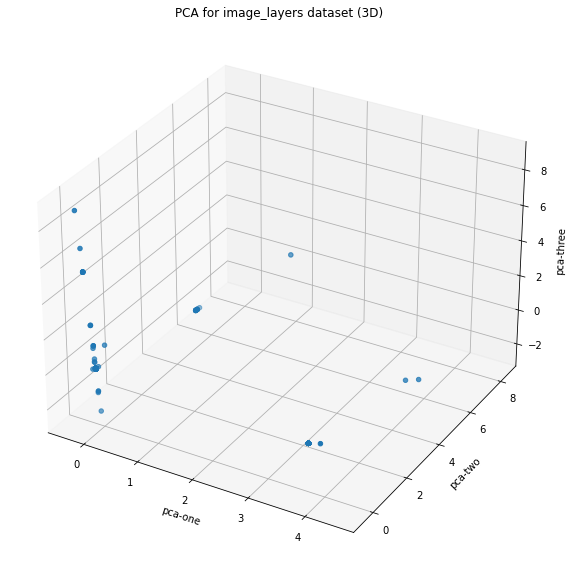

In [26]:
# Visualizing the results of the 3D PCA.
ax = plt.figure(figsize=(10, 10)).gca(projection="3d")
plt.title("3D Principal Component Analysis (PCA)")
ax.scatter(
    xs=pc3[:, 0],
    ys=pc3[:, 1],
    zs=pc3[:, 2],
)
ax.set_xlabel("pca-one")
ax.set_ylabel("pca-two")
ax.set_zlabel("pca-three")
plt.title("PCA for image_layers dataset (3D)")
plt.show()

**Interactive 3D plot for image layer dataset**

In [27]:
fig = px.scatter_3d(pc3, x=pc3[:, 0], y=pc3[:, 1], z=pc3[:, 2], opacity=0.5)
fig.show()

**3D principal component analysis for container dataset**

In [28]:
pcc3 = pca3.fit_transform(X_cont)

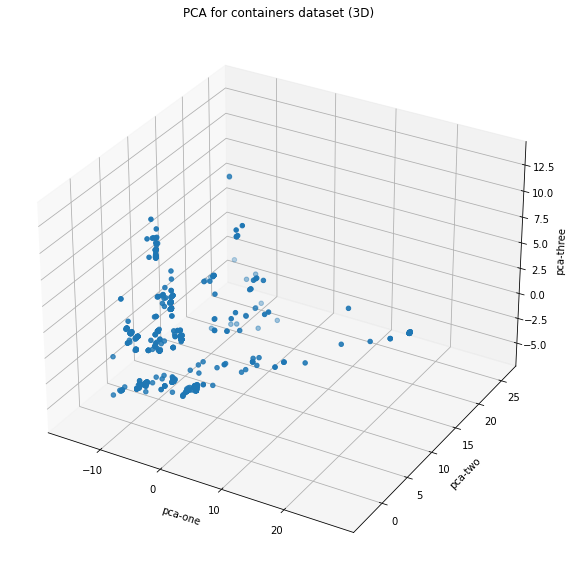

In [29]:
# Visualizing the results of the 3D PCA.
ax = plt.figure(figsize=(10, 10)).gca(projection="3d")
plt.title("3D Principal Component Analysis (PCA)")
ax.scatter(
    xs=pcc3[:, 0],
    ys=pcc3[:, 1],
    zs=pcc3[:, 2],
)
ax.set_xlabel("pca-one")
ax.set_ylabel("pca-two")
ax.set_zlabel("pca-three")
plt.title("PCA for containers dataset (3D)")
plt.show()

**3D interactive visualization**

In [30]:
fig = px.scatter_3d(pcc3, x=pcc3[:, 0], y=pcc3[:, 1], z=pcc3[:, 2], opacity=1)
fig.show()

Now that we have visualized both image_layer dataset and container dataset in both 2D and 3D. We now implement `Kmeans` to identify different clusters in the set.

Before applying KMeans by inserting the number of clusters, we first find the optimal number of clusters in the dataset by using the Elbow method.

## **The Elbow Method** 

The elbow method is used to determine the optimal numbers of clusters in K-means clustering. The elbow method plots the value of `inertia` produced by different values of K. 

Inertia is the within-cluster sum of squares criterion. It is a metric that shows how internally coherant the clusters are. It measures how well a dataset was clustered by K-Means. It is calculated by measuring the distance between each data point and its centroid, squaring this distance, and summing these squares across one cluster. A good model is one with low inertia AND a low number of clusters ( K ).

Applying the elbow method for the image layer dataset, we set the range of cluster from 1 - 10. 

In [31]:
# How to find the best number of clusters?

no_of_clusters = range(1, 10)
inertia = []

for f in tqdm(no_of_clusters):
    kmeans = KMeans(n_clusters=f, random_state=2)
    kmeans = kmeans.fit(X_image)
    u = kmeans.inertia_
    inertia.append(u)

100%|██████████| 9/9 [00:07<00:00,  1.24it/s]


**Inertia vs Number of cluster plot**

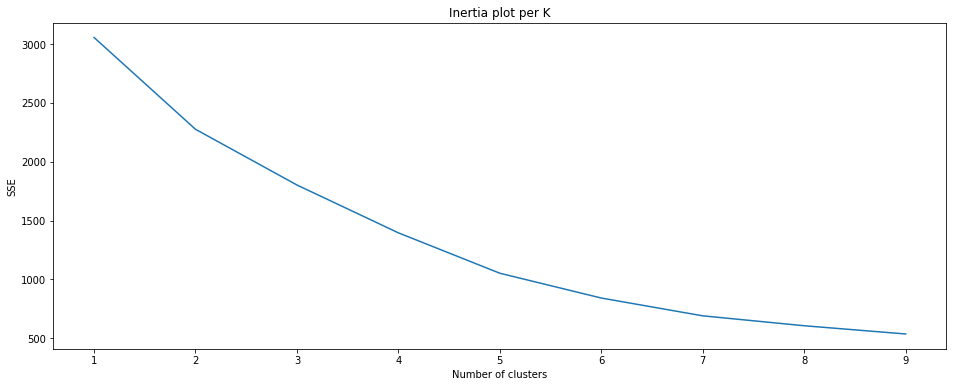

In [32]:
fig, (ax1) = plt.subplots(1, figsize=(16, 6))
xx = np.arange(len(no_of_clusters))
ax1.plot(xx, inertia)
ax1.set_xticks(xx)
ax1.set_xticklabels(no_of_clusters, rotation="horizontal")
plt.xlabel("Number of clusters")
plt.ylabel("SSE")
plt.title("Inertia plot per K")
plt.show()

From the above plot, it is seen that the optimal number of clusters for image layers dataset is 5. We will later apply it when implementing KMeans algorithm.

Next, we search for optimal number of clusters for **container dataset**.

In [33]:
# How to find the best number of clusters?

no_of_clusters = range(1, 10)
inertia = []

for f in tqdm(no_of_clusters):
    kmeans = KMeans(n_clusters=f, random_state=2)
    kmeans = kmeans.fit(X_cont)
    u = kmeans.inertia_
    inertia.append(u)

100%|██████████| 9/9 [00:17<00:00,  1.97s/it]


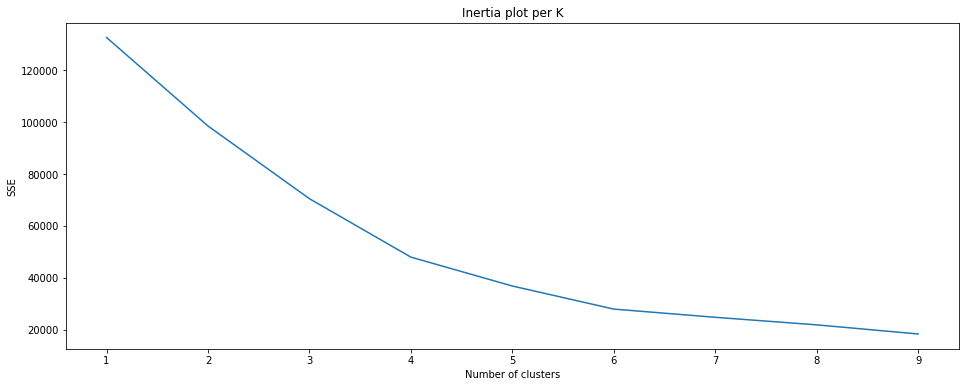

In [34]:
fig, (ax1) = plt.subplots(1, figsize=(16, 6))
xx = np.arange(len(no_of_clusters))
ax1.plot(xx, inertia)
ax1.set_xticks(xx)
ax1.set_xticklabels(no_of_clusters, rotation="horizontal")
plt.xlabel("Number of clusters")
plt.ylabel("SSE")
plt.title("Inertia plot per K")
plt.show()

Based on the elbow plot, we will take 4 as the optimal number of clusters, which we will later apply through KMeans.

# Implementing KMeans for `image_layer_dataset`

We take the number of clusters = 5 and apply the KMeans algorithm.

In [35]:
kmeans = KMeans(n_clusters=5, random_state=2)
kmeans = kmeans.fit(X_image)
clusters = kmeans.predict(X_image)

In [36]:
clusters

array([0, 0, 2, ..., 0, 0, 0], dtype=int32)

In [37]:
cluster_image_df = X_image
cluster_image_df["clusters"] = clusters

In [38]:
cluster_image_df.head()

,3scale-amp2/apicast-gateway-rhel8,3scale-amp2/backend-rhel7,3scale-amp2/memcached-rhel7,3scale-amp2/system-rhel7,3scale-amp2/zync-rhel7,jboss-amq-6/amq63-openshift,openshift/ose-cli,openshift/ose-cli-artifacts,openshift/ose-grafana,openshift/ose-jenkins,openshift/ose-must-gather,openshift/ose-oauth-proxy,openshift/ose-tests,openshift/ose-tools,rhel8/httpd-24,rhel8/mysql-80,rhel8/postgresql-10,rhel8/postgresql-12,rhel8/redis-5,rhscl/mongodb-36-rhel7,rhscl/mysql-57-rhel7,rhscl/postgresql-10-rhel7,rhscl/redis-32-rhel7,ubi8/dotnet-50,ubi8/ruby-27,clusters
cluster_id,,,,,,,,,,,,,,,,,,,,,,,,,,
00003d61-9db1-4757-9cd1-84df271daeb9,0,0,0,0,0,0,5,6,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0
00351e6e-53ce-465e-9493-cf0cd2367049,0,0,0,0,0,0,5,6,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0
003ba133-e754-4d5a-bc57-675b386d1f05,0,0,0,0,0,0,5,0,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,2
00479ead-b7fc-49c2-ae20-3990a9b3d08c,0,0,0,0,0,0,5,6,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0
00748c32-15c3-4586-98fb-e5078ca9f3b8,0,0,0,0,0,0,5,6,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0


**Visualizing the results of the 3D PCA**

In [39]:
pca_i = pca3.fit_transform(cluster_image_df)

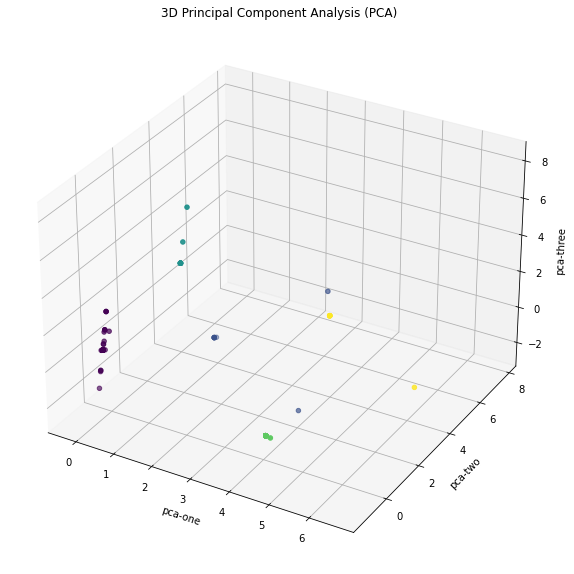

In [40]:
# Visualizing the results of the 3D PCA.
ax = plt.figure(figsize=(10, 10)).gca(projection="3d")
plt.title("3D Principal Component Analysis (PCA)")
ax.scatter(
    xs=pca_i[:, 0], ys=pca_i[:, 1], zs=pca_i[:, 2], c=cluster_image_df["clusters"]
)
ax.set_xlabel("pca-one")
ax.set_ylabel("pca-two")
ax.set_zlabel("pca-three")
plt.show()

**3D interactive visualization for image dataset**

In [41]:
fig = px.scatter_3d(
    pca_i,
    x=pca_i[:, 0],
    y=pca_i[:, 1],
    z=pca_i[:, 2],
    color=cluster_image_df["clusters"],
    opacity=0.1,
)
fig.show()

**Listing out the groups of image_name in different clusters**

In [42]:
df1 = pd.DataFrame([])
global_mean = cluster_image_df.mean().sort_values(ascending=False)


for c in tqdm(range(0, 5)):
    c = cluster_image_df[cluster_image_df.clusters == c].iloc[:, :-1].mean()
    diff = c - global_mean
    d = diff.sort_values(ascending=False).head(20)
    d1 = pd.DataFrame(d).reset_index()
    d1.rename(columns={"index": "image_name"}, inplace=True)
    df1 = df1.append(d1.image_name)
df1 = df1.reset_index()
df1.rename(
    index={
        0: "cluster 1",
        1: "cluster 2",
        2: "cluster 3",
        3: "cluster 4",
        4: "cluster 5",
    },
    inplace=True,
)
df1.drop(columns="index", inplace=True)

df1

100%|██████████| 5/5 [00:00<00:00, 188.80it/s]


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
cluster 1,openshift/ose-cli-artifacts,openshift/ose-oauth-proxy,openshift/ose-cli,openshift/ose-jenkins,rhscl/postgresql-10-rhel7,openshift/ose-tests,3scale-amp2/system-rhel7,3scale-amp2/zync-rhel7,jboss-amq-6/amq63-openshift,3scale-amp2/backend-rhel7,openshift/ose-grafana,rhel8/postgresql-10,ubi8/dotnet-50,rhscl/redis-32-rhel7,rhscl/mysql-57-rhel7,rhel8/redis-5,3scale-amp2/apicast-gateway-rhel8,3scale-amp2/memcached-rhel7,rhscl/mongodb-36-rhel7,rhel8/httpd-24
cluster 2,openshift/ose-tools,openshift/ose-must-gather,rhel8/httpd-24,rhel8/mysql-80,rhel8/postgresql-12,openshift/ose-cli-artifacts,openshift/ose-oauth-proxy,openshift/ose-cli,3scale-amp2/apicast-gateway-rhel8,3scale-amp2/memcached-rhel7,ubi8/dotnet-50,rhscl/mysql-57-rhel7,rhel8/postgresql-10,rhel8/redis-5,rhscl/redis-32-rhel7,openshift/ose-grafana,3scale-amp2/backend-rhel7,jboss-amq-6/amq63-openshift,3scale-amp2/zync-rhel7,3scale-amp2/system-rhel7
cluster 3,ubi8/ruby-27,rhscl/mongodb-36-rhel7,3scale-amp2/apicast-gateway-rhel8,3scale-amp2/memcached-rhel7,ubi8/dotnet-50,rhscl/redis-32-rhel7,rhscl/mysql-57-rhel7,rhel8/redis-5,rhel8/postgresql-10,openshift/ose-grafana,3scale-amp2/system-rhel7,3scale-amp2/zync-rhel7,jboss-amq-6/amq63-openshift,3scale-amp2/backend-rhel7,openshift/ose-tests,rhscl/postgresql-10-rhel7,rhel8/httpd-24,rhel8/mysql-80,openshift/ose-jenkins,openshift/ose-tools
cluster 4,rhel8/postgresql-12,rhel8/mysql-80,openshift/ose-cli-artifacts,openshift/ose-oauth-proxy,openshift/ose-cli,3scale-amp2/apicast-gateway-rhel8,3scale-amp2/memcached-rhel7,rhscl/redis-32-rhel7,rhel8/redis-5,rhscl/mysql-57-rhel7,rhel8/postgresql-10,ubi8/dotnet-50,openshift/ose-grafana,3scale-amp2/backend-rhel7,jboss-amq-6/amq63-openshift,3scale-amp2/zync-rhel7,3scale-amp2/system-rhel7,openshift/ose-tests,rhel8/httpd-24,rhscl/postgresql-10-rhel7
cluster 5,openshift/ose-must-gather,rhel8/postgresql-12,openshift/ose-cli-artifacts,openshift/ose-oauth-proxy,openshift/ose-cli,3scale-amp2/apicast-gateway-rhel8,3scale-amp2/memcached-rhel7,rhel8/redis-5,rhscl/mysql-57-rhel7,rhscl/redis-32-rhel7,rhel8/postgresql-10,ubi8/dotnet-50,openshift/ose-grafana,3scale-amp2/backend-rhel7,jboss-amq-6/amq63-openshift,3scale-amp2/zync-rhel7,3scale-amp2/system-rhel7,openshift/ose-tests,rhel8/httpd-24,rhscl/postgresql-10-rhel7


We generated the above dataframe by differencitating the global mean with the mean of the individual cluster, represented as a index in the dataframe. Each row in the dataframe df1, represents groups of top 20 image_names having a higher probability of occuring/running for the same user.

# Implementing KMeans for `container dataset`

We take the number of clusters = 4. Because of the large number of unique features, the program will be computationally intensive. We apply KMeans algorithm by selecting 10 clusters.

In [43]:
kmeans = KMeans(n_clusters=4, random_state=2)
kmeans = kmeans.fit(X_cont)
clusters = kmeans.predict(X_cont)

In [44]:
clusters

array([0, 0, 3, ..., 0, 0, 1], dtype=int32)

In [45]:
cluster_cont_df = X_cont
cluster_cont_df["clusters"] = clusters

In [46]:
cluster_cont_df.head()

,3scale-amp2/3scale-rhel7-operator,3scale-amp2/apicast-gateway-rhel8,3scale-amp2/backend-rhel7,3scale-amp2/memcached-rhel7,3scale-amp2/system-rhel7,3scale-amp2/zync-rhel7,Calico Operator,Cilium,Cloud Native PostgreSQL Operator,Elastic Cloud on Kubernetes,F5 BIG-IP Controller Operator,NGINX Ingress Operator,NVIDIA GPU Operator,Seldon Operator,alertmanager,amq7/amq-broker-rhel7-operator,amq7/amq-streams-kafka-25-rhel7,amq7/amq-streams-kafka-26-rhel7,amq7/amq-streams-rhel7-operator,amq7/amq-streams-rhel7-operator-metadata,ansible-automation-platform/platform-resource-rhel7-operator,ansible-tower,cephcsi,cert-manager cainjector,cert-manager controller,cert-manager webhook,codeready-workspaces/devfileregistry-rhel8,codeready-workspaces/operator,codeready-workspaces/pluginregistry-rhel8,codeready-workspaces/server-rhel8,collectd-exporter,container-native-virtualization/bridge-marker,container-native-virtualization/cluster-network-addons-operator,container-native-virtualization/cnv-containernetworking-plugins,container-native-virtualization/hostpath-provisioner-rhel8-operator,container-native-virtualization/hyperconverged-cluster-operator,container-native-virtualization/hyperconverged-cluster-webhook-rhel8,container-native-virtualization/kubemacpool,container-native-virtualization/kubernetes-nmstate-handler-rhel8,container-native-virtualization/kubevirt-cpu-model-nfd-plugin,container-native-virtualization/kubevirt-cpu-node-labeller,container-native-virtualization/kubevirt-kvm-info-nfd-plugin,container-native-virtualization/kubevirt-ssp-operator,container-native-virtualization/node-maintenance-operator,container-native-virtualization/ovs-cni-marker,container-native-virtualization/ovs-cni-plugin,container-native-virtualization/virt-api,container-native-virtualization/virt-cdi-apiserver,container-native-virtualization/virt-cdi-controller,container-native-virtualization/virt-cdi-importer,container-native-virtualization/virt-cdi-operator,container-native-virtualization/virt-cdi-uploadproxy,container-native-virtualization/virt-controller,container-native-virtualization/virt-handler,container-native-virtualization/virt-launcher,container-native-virtualization/virt-operator,container-native-virtualization/vm-import-controller-rhel8,container-native-virtualization/vm-import-operator-rhel8,costmanagement-metrics-operator,distributed-tracing/jaeger-rhel8-operator,grafana,ibm common service webhook,ibm-events-operator,ibm-postgresql,jboss-amq-6/amq63-openshift,jboss-eap-7/eap73-rhel8-operator,kube-state-metrics,mcg-core,mcg-operator,mcr.microsoft.com/mssql/rhel8/server,must-gather-service,ocp-tools-4/odo-init-image,ocs-operator,ocs-registry,openshift-compliance-content,openshift-gitops-1-tech-preview/argocd-rhel8,openshift-gitops-1-tech-preview/gitops-rhel8,openshift-gitops-1-tech-preview/gitops-rhel8-operator,openshift-gitops-1-tech-preview/kam-delivery-rhel8,openshift-gitops-1/gitops-rhel8,openshift-gitops-1/kam-delivery-rhel8,openshift-logging/cluster-logging-operator-bundle,openshift-logging/cluster-logging-rhel8-operator,openshift-logging/elasticsearch-operator-bundle,openshift-logging/elasticsearch-proxy-rhel8,openshift-logging/elasticsearch-rhel8-operator,openshift-logging/elasticsearch6-rhel8,openshift-logging/fluentd-rhel8,openshift-logging/kibana6-rhel8,openshift-pipelines-tech-preview/pipelines-controller-rhel8,openshift-pipelines-tech-preview/pipelines-operator-proxy-rhel8,openshift-pipelines-tech-preview/pipelines-rhel8-operator,openshift-pipelines-tech-preview/pipelines-triggers-controller-rhel8,openshift-pipelines-tech-preview/pipelines-triggers-webhook-rhel8,openshift-pipelines-tech-preview/pipelines-webhook-rhel8,openshift-pipelines/pipelines-controller-rhel8,openshift-pipelines/pipelines-operator-proxy-rhel8,openshift-pipelines/pipelines-rhel8-operator,openshift-pipelines/pipelines-triggers-controller-rhel8,openshift-pipelines/pipelines-triggers-core-interceptors-rhel8,openshift-pipelines/pipelines-triggers-eventlistenersink-rh

**Visualizing the results of the 3D PCA**

In [47]:
pca_c = pca3.fit_transform(cluster_cont_df)

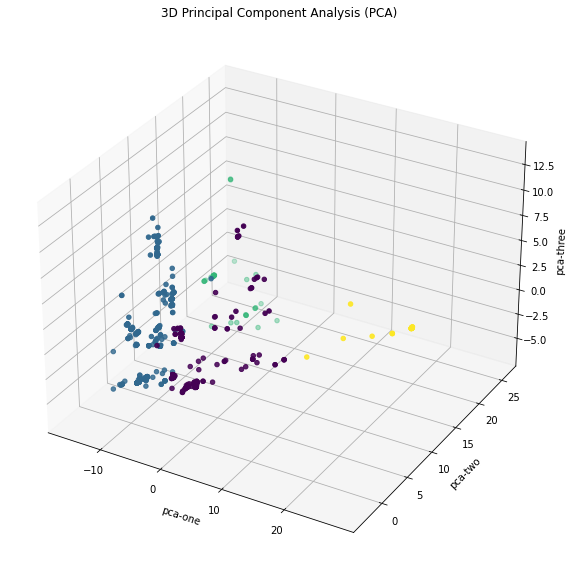

In [48]:
# Visualizing the results of the 3D PCA.
ax = plt.figure(figsize=(10, 10)).gca(projection="3d")
plt.title("3D Principal Component Analysis (PCA)")
ax.scatter(
    xs=pca_c[:, 0], ys=pca_c[:, 1], zs=pca_c[:, 2], c=cluster_cont_df["clusters"]
)
ax.set_xlabel("pca-one")
ax.set_ylabel("pca-two")
ax.set_zlabel("pca-three")
plt.show()

**3D interactive visualization for image dataset**

In [49]:
fig = px.scatter_3d(
    pca_c,
    x=pca_c[:, 0],
    y=pca_c[:, 1],
    z=pca_c[:, 2],
    color=cluster_cont_df["clusters"],
    opacity=0.1,
)
fig.show()

**Listing out the groups of image_name in different clusters**

In [50]:
df1 = pd.DataFrame([])
global_mean = cluster_cont_df.mean().sort_values(ascending=False)


for c in tqdm(range(0, 4)):
    c = cluster_cont_df[cluster_cont_df.clusters == c].iloc[:, :-1].mean()
    diff = c - global_mean
    d = diff.sort_values(ascending=False).head(20)
    d1 = pd.DataFrame(d).reset_index()
    d1.rename(columns={"index": "image_name"}, inplace=True)
    df1 = df1.append(d1.image_name)
df1 = df1.reset_index()
df1.rename(
    index={0: "cluster 1", 1: "cluster 2", 2: "cluster 3", 3: "cluster 4"}, inplace=True
)
df1.drop(columns="index", inplace=True)

df1

100%|██████████| 4/4 [00:00<00:00, 177.03it/s]


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
cluster 1,rhacm2/work-rhel8,rhacm2/registration-rhel8,rhacm2/registration-rhel8-operator,rhacm2/multicloud-manager-rhel8,openshift/ose-cluster-kube-apiserver-operator,openshift/ose-hyperkube,openshift/ose-etcd,openshift/ose-thanos,openshift/ose-sdn,openshift/ose-machine-config-operator,openshift/ose-operator-lifecycle-manager,openshift/ose-cluster-kube-controller-manager-...,openshift/ose-cluster-network-operator,openshift/ose-cluster-kube-scheduler-operator,openshift/ose-oauth-proxy,openshift/ose-service-ca-operator,openshift/ose-oauth-apiserver,openshift/ose-prometheus-node-exporter,openshift/ose-openshift-apiserver,openshift/ose-cluster-node-tuning-operator
cluster 2,openshift/ose-kube-rbac-proxy,openshift/ose-machine-api-operator,openshift/ose-baremetal-runtimecfg,openshift/ose-ironic,openshift/ose-ovn-kubernetes,openshift/ose-csi-livenessprobe,openshift/ose-cli,openshift/ose-aws-ebs-csi-driver,openshift/ose-ironic-inspector,openshift/ose-ironic-ipa-downloader,openshift/ose-ironic-machine-os-downloader,openshift/ose-csi-external-provisioner,openshift/ose-csi-node-driver-registrar,openshift/ose-csi-external-attacher,openshift/ose-haproxy-router,openshift/ose-csi-external-resizer,openshift/ose-coredns,openshift/ose-csi-external-snapshotter,openshift/ose-keepalived-ipfailover,openshift/ose-aws-pod-identity-webhook
cluster 3,rhceph,openshift/ose-kube-rbac-proxy,openshift/ose-baremetal-runtimecfg,openshift/ose-csi-external-snapshotter,openshift/ose-csi-node-driver-registrar,openshift/ose-machine-api-operator,openshift/ose-csi-external-provisioner,openshift/ose-csi-driver-manila,openshift/ose-csi-driver-nfs,openshift/ose-openstack-cinder-csi-driver,rook-ceph,rhel8/postgresql-12,cephcsi,openshift/ose-local-storage-diskmaker,openshift/ose-local-storage-operator,openshift/ose-mdns-publisher,openshift/ose-cli,openshift/ose-csi-external-resizer,container-native-virtualization/virt-launcher,openshift/ose-csi-external-attacher
cluster 4,openshift/ose-local-storage-operator,openshift/ose-local-storage-diskmaker,openshift/ose-local-storage-operator-bundle,container-native-virtualization/kubevirt-cpu-n...,container-native-virtualization/virt-operator,container-native-virtualization/virt-controller,container-native-virtualization/virt-handler,container-native-virtualization/kubernetes-nms...,container-native-virtualization/kubemacpool,ubi8/dotnet-50,Cilium,openshift-serverless-1/serving-queue-rhel8,container-native-virtualization/node-maintenan...,container-native-virtualization/cnv-containern...,container-native-virtualization/vm-import-cont...,container-native-virtualization/virt-cdi-uploa...,container-native-virtualization/kubevirt-cpu-m...,container-native-virtualization/kubevirt-kvm-i...,container-native-virtualization/virt-cdi-operator,container-native-virtualization/virt-api


We generated the above dataframe by differencitating the global mean with the mean of the individual cluster, represented as a index in the dataframe. Each row in the dataframe df1, represents groups of top 20 image_names having a higher probability of occuring/running for the same user.

---

---

# KMeans clustering by similarity encoders: (Taking frequency into considerations)

Clustering categorical features are challenging due to lack of labels required for analysing the data. Therefore, it becomes essential to apply the right encoding scheme for corresponding features. Pros and cons of different encode process are descried in this [notebook](https://github.com/aicoe-aiops/categorical-encoding/blob/master/notebooks/demo/demo.ipynb).

For the feature, `name` resembling different product names is a nominal categorical feature. It is a challenge to balance between performance and explainability. In this analysis, we are following word based encoders, i.e., Similarity Encoders which extracts the information from the n-grams(collection of characters) present in the strings.

**Encoding Image_layer dataset**

In this issue, we are applying the encoding for the `image_name` from the dataset. Similar to previous approach, we encoded the image_name with respect to the `cluster_id`. 

**Similarity encoding**

In [51]:
df_image_name = df_image[["name"]].reindex()
enc = SimilarityEncoder(similarity="ngram")
X_enc = enc.fit_transform(df_image_name)
X_image_name = pd.DataFrame(X_enc)
X_image_name.columns = sorted(df_image_name.name.unique())
X_image = pd.concat([df_image["cluster_id"], X_image_name], axis=1)
X_image = X_image.set_index("cluster_id")
X_image = X_image.groupby(level=0).sum()

In [52]:
X_image.head()

,3scale-amp2/apicast-gateway-rhel8,3scale-amp2/backend-rhel7,3scale-amp2/memcached-rhel7,3scale-amp2/system-rhel7,3scale-amp2/zync-rhel7,jboss-amq-6/amq63-openshift,openshift/ose-cli,openshift/ose-cli-artifacts,openshift/ose-grafana,openshift/ose-jenkins,openshift/ose-must-gather,openshift/ose-oauth-proxy,openshift/ose-tests,openshift/ose-tools,rhel8/httpd-24,rhel8/mysql-80,rhel8/postgresql-10,rhel8/postgresql-12,rhel8/redis-5,rhscl/mongodb-36-rhel7,rhscl/mysql-57-rhel7,rhscl/postgresql-10-rhel7,rhscl/redis-32-rhel7,ubi8/dotnet-50,ubi8/ruby-27
cluster_id,,,,,,,,,,,,,,,,,,,,,,,,,
00003d61-9db1-4757-9cd1-84df271daeb9,0.124094,0.292594,0.177182,0.147851,0.154433,2.684535,10.221675,10.190476,6.483450,6.483450,5.695925,8.241379,7.128506,6.952486,0.0,0.0,0.121059,0.121059,0.0,0.084199,0.088312,0.185413,0.088312,0.0,0.0
00351e6e-53ce-465e-9493-cf0cd2367049,0.124094,0.292594,0.177182,0.147851,0.154433,2.684535,10.221675,10.190476,6.483450,6.483450,5.695925,8.241379,7.128506,6.952486,0.0,0.0,0.121059,0.121059,0.0,0.084199,0.088312,0.185413,0.088312,0.0,0.0
003ba133-e754-4d5a-bc57-675b386d1f05,0.056678,0.134699,0.063974,0.068381,0.071675,1.691729,6.793103,4.190476,4.175758,4.175758,3.695925,6.241379,4.503506,4.503506,0.0,0.0,0.077263,0.077263,0.0,0.043103,0.045455,0.107491,0.045455,0.0,0.0
00479ead-b7fc-49c2-ae20-3990a9b3d08c,0.124094,0.292594,0.177182,0.147851,0.154433,2.684535,10.221675,10.190476,6.483450,6.483450,5.695925,8.241379,7.128506,6.952486,0.0,0.0,0.121059,0.121059,0.0,0.084199,0.088312,0.185413,0.088312,0.0,0.0
00748c32-15c3-4586-98fb-e5078ca9f3b8,0.124094,0.292594,0.177182,0.147851,0.154433,2.684535,10.221675,10.190476,6.483450,6.483450,5.695925,8.241379,7.128506,6.952486,0.0,0.0,0.121059,0.121059,0.0,0.084199,0.088312,0.185413,0.088312,0.0,0.0


In [53]:
X_image.shape

(1810, 25)

1810 rows corresponds to 1810 cluster_id. 

**Encoding container dataset**

In [54]:
df_cont_name = df_cont[["name"]].reindex()
enc = SimilarityEncoder(similarity="ngram")
X_enc = enc.fit_transform(df_cont_name)
X_cont_name = pd.DataFrame(X_enc)
X_cont_name.columns = sorted(df_cont_name.name.unique())
X_cont = pd.concat([df_cont["cluster_id"], X_cont_name], axis=1)
X_cont = X_cont.set_index("cluster_id")
X_cont = X_cont.groupby(level=0).sum()

In [55]:
X_cont.head()

,3scale-amp2/3scale-rhel7-operator,3scale-amp2/apicast-gateway-rhel8,3scale-amp2/backend-rhel7,3scale-amp2/memcached-rhel7,3scale-amp2/system-rhel7,3scale-amp2/zync-rhel7,Calico Operator,Cilium,Cloud Native PostgreSQL Operator,Elastic Cloud on Kubernetes,F5 BIG-IP Controller Operator,NGINX Ingress Operator,NVIDIA GPU Operator,Seldon Operator,alertmanager,amq7/amq-broker-rhel7-operator,amq7/amq-streams-kafka-25-rhel7,amq7/amq-streams-kafka-26-rhel7,amq7/amq-streams-rhel7-operator,amq7/amq-streams-rhel7-operator-metadata,ansible-automation-platform/platform-resource-rhel7-operator,ansible-tower,cephcsi,cert-manager cainjector,cert-manager controller,cert-manager webhook,codeready-workspaces/devfileregistry-rhel8,codeready-workspaces/operator,codeready-workspaces/pluginregistry-rhel8,codeready-workspaces/server-rhel8,collectd-exporter,container-native-virtualization/bridge-marker,container-native-virtualization/cluster-network-addons-operator,container-native-virtualization/cnv-containernetworking-plugins,container-native-virtualization/hostpath-provisioner-rhel8-operator,container-native-virtualization/hyperconverged-cluster-operator,container-native-virtualization/hyperconverged-cluster-webhook-rhel8,container-native-virtualization/kubemacpool,container-native-virtualization/kubernetes-nmstate-handler-rhel8,container-native-virtualization/kubevirt-cpu-model-nfd-plugin,container-native-virtualization/kubevirt-cpu-node-labeller,container-native-virtualization/kubevirt-kvm-info-nfd-plugin,container-native-virtualization/kubevirt-ssp-operator,container-native-virtualization/node-maintenance-operator,container-native-virtualization/ovs-cni-marker,container-native-virtualization/ovs-cni-plugin,container-native-virtualization/virt-api,container-native-virtualization/virt-cdi-apiserver,container-native-virtualization/virt-cdi-controller,container-native-virtualization/virt-cdi-importer,container-native-virtualization/virt-cdi-operator,container-native-virtualization/virt-cdi-uploadproxy,container-native-virtualization/virt-controller,container-native-virtualization/virt-handler,container-native-virtualization/virt-launcher,container-native-virtualization/virt-operator,container-native-virtualization/vm-import-controller-rhel8,container-native-virtualization/vm-import-operator-rhel8,costmanagement-metrics-operator,distributed-tracing/jaeger-rhel8-operator,grafana,ibm common service webhook,ibm-events-operator,ibm-postgresql,jboss-amq-6/amq63-openshift,jboss-eap-7/eap73-rhel8-operator,kube-state-metrics,mcg-core,mcg-operator,mcr.microsoft.com/mssql/rhel8/server,must-gather-service,ocp-tools-4/odo-init-image,ocs-operator,ocs-registry,openshift-compliance-content,openshift-gitops-1-tech-preview/argocd-rhel8,openshift-gitops-1-tech-preview/gitops-rhel8,openshift-gitops-1-tech-preview/gitops-rhel8-operator,openshift-gitops-1-tech-preview/kam-delivery-rhel8,openshift-gitops-1/gitops-rhel8,openshift-gitops-1/kam-delivery-rhel8,openshift-logging/cluster-logging-operator-bundle,openshift-logging/cluster-logging-rhel8-operator,openshift-logging/elasticsearch-operator-bundle,openshift-logging/elasticsearch-proxy-rhel8,openshift-logging/elasticsearch-rhel8-operator,openshift-logging/elasticsearch6-rhel8,openshift-logging/fluentd-rhel8,openshift-logging/kibana6-rhel8,openshift-pipelines-tech-preview/pipelines-controller-rhel8,openshift-pipelines-tech-preview/pipelines-operator-proxy-rhel8,openshift-pipelines-tech-preview/pipelines-rhel8-operator,openshift-pipelines-tech-preview/pipelines-triggers-controller-rhel8,openshift-pipelines-tech-preview/pipelines-triggers-webhook-rhel8,openshift-pipelines-tech-preview/pipelines-webhook-rhel8,openshift-pipelines/pipelines-controller-rhel8,openshift-pipelines/pipelines-operator-proxy-rhel8,openshift-pipelines/pipelines-rhel8-operator,openshift-pipelines/pipelines-triggers-controller-rhel8,openshift-pipelines/pipelines-triggers-core-interceptors-rhel8,openshift-pipelines/pipelines-triggers-eventlistenersink-rh

In [56]:
X_cont.shape

(1881, 353)

1881 rows corresponds to 1881 cluster_id.

**3D plot for image_layer_dataset**

In [57]:
pca3 = PCA(n_components=3)
pc3 = pca3.fit_transform(X_image)

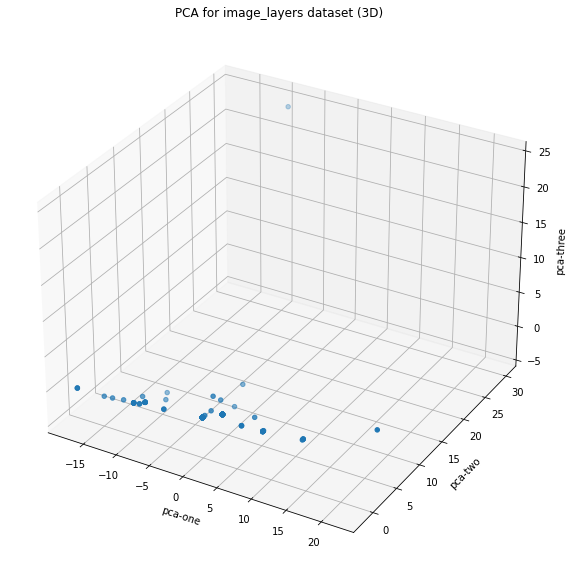

In [58]:
# Visualizing the results of the 3D PCA.
ax = plt.figure(figsize=(10, 10)).gca(projection="3d")
plt.title("3D Principal Component Analysis (PCA)")
ax.scatter(
    xs=pc3[:, 0],
    ys=pc3[:, 1],
    zs=pc3[:, 2],
)
ax.set_xlabel("pca-one")
ax.set_ylabel("pca-two")
ax.set_zlabel("pca-three")
plt.title("PCA for image_layers dataset (3D)")
plt.show()

**3D interactive visualization for image dataset**

In [59]:
fig = px.scatter_3d(pc3, x=pc3[:, 0], y=pc3[:, 1], z=pc3[:, 2], opacity=0.5)
fig.show()

**3D principal component analysis for container dataset**

In [60]:
pcc3 = pca3.fit_transform(X_cont)

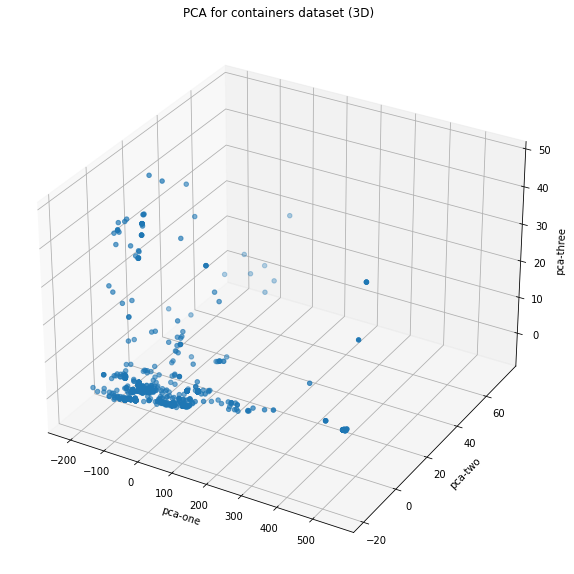

In [61]:
# Visualizing the results of the 3D PCA.
ax = plt.figure(figsize=(10, 10)).gca(projection="3d")
plt.title("3D Principal Component Analysis (PCA)")
ax.scatter(
    xs=pcc3[:, 0],
    ys=pcc3[:, 1],
    zs=pcc3[:, 2],
)
ax.set_xlabel("pca-one")
ax.set_ylabel("pca-two")
ax.set_zlabel("pca-three")
plt.title("PCA for containers dataset (3D)")
plt.show()

**3D interactive visualization**

In [62]:
fig = px.scatter_3d(pcc3, x=pcc3[:, 0], y=pcc3[:, 1], z=pcc3[:, 2], opacity=1)
fig.show()

Now that we have visualized both image_layer dataset and container dataset in both 2D and 3D. We now implement `Kmeans` to identify different clusters in the set.

Before applying KMeans by inserting the number of clusters, we first find the optimal number of clusters in the dataset by using the Elbow method.

# **The Elbow Method**

Applying the elbow method for the image layer dataset, we set the range of cluster from 1 - 10. 

In [63]:
# How to find the best number of clusters?

no_of_clusters = range(1, 10)
inertia = []

for f in tqdm(no_of_clusters):
    kmeans = KMeans(n_clusters=f, random_state=2)
    kmeans = kmeans.fit(X_image)
    u = kmeans.inertia_
    inertia.append(u)

100%|██████████| 9/9 [00:06<00:00,  1.34it/s]


**Inertia vs Number of cluster plot**

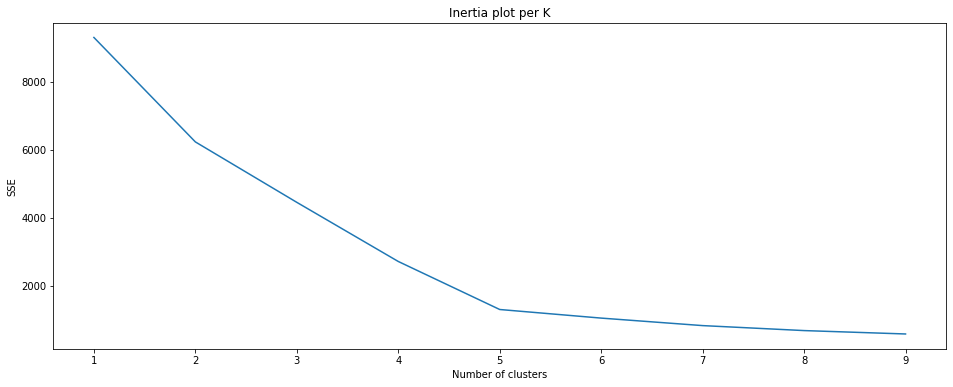

In [64]:
fig, (ax1) = plt.subplots(1, figsize=(16, 6))
xx = np.arange(len(no_of_clusters))
ax1.plot(xx, inertia)
ax1.set_xticks(xx)
ax1.set_xticklabels(no_of_clusters, rotation="horizontal")
plt.xlabel("Number of clusters")
plt.ylabel("SSE")
plt.title("Inertia plot per K")
plt.show()

We see that the optimal number of clusters for image_layer dataset is 5. 

Now checking for the **containers dataset**.

In [65]:
# How to find the best number of clusters?

no_of_clusters = range(1, 10)
inertia = []

for f in tqdm(no_of_clusters):
    kmeans = KMeans(n_clusters=f, random_state=2)
    kmeans = kmeans.fit(X_cont)
    u = kmeans.inertia_
    inertia.append(u)

100%|██████████| 9/9 [00:19<00:00,  2.19s/it]


Text(0.5, 1.0, 'Inertia plot per K')

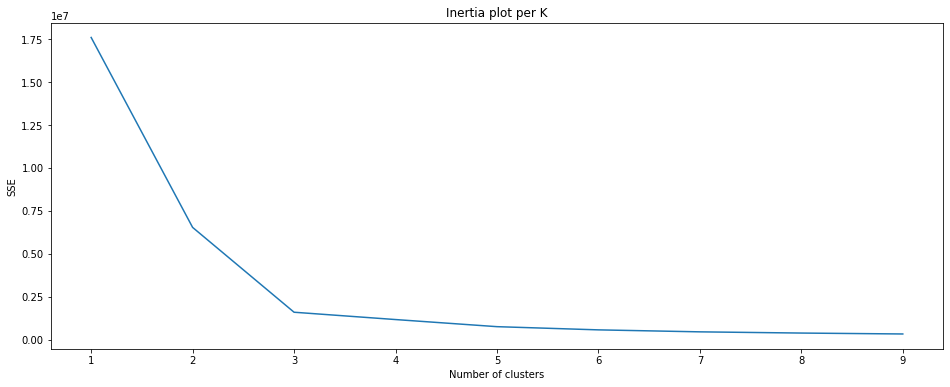

In [66]:
fig, (ax1) = plt.subplots(1, figsize=(16, 6))
xx = np.arange(len(no_of_clusters))
ax1.plot(xx, inertia)
ax1.set_xticks(xx)
ax1.set_xticklabels(no_of_clusters, rotation="horizontal")
plt.xlabel("Number of clusters")
plt.ylabel("SSE")
plt.title("Inertia plot per K")

Optimal number of clusters for container dataset: 3

# Implementing KMeans for `image_layer_dataset`

We take the number of clusters = 5 and apply the KMeans algorithm.

In [67]:
kmeans = KMeans(n_clusters=5, random_state=2)
kmeans = kmeans.fit(X_image)
clusters = kmeans.predict(X_image)

In [68]:
clusters

array([0, 0, 3, ..., 0, 0, 0], dtype=int32)

In [69]:
cluster_image_df = X_image
cluster_image_df["clusters"] = clusters

In [70]:
cluster_image_df.head()

,3scale-amp2/apicast-gateway-rhel8,3scale-amp2/backend-rhel7,3scale-amp2/memcached-rhel7,3scale-amp2/system-rhel7,3scale-amp2/zync-rhel7,jboss-amq-6/amq63-openshift,openshift/ose-cli,openshift/ose-cli-artifacts,openshift/ose-grafana,openshift/ose-jenkins,openshift/ose-must-gather,openshift/ose-oauth-proxy,openshift/ose-tests,openshift/ose-tools,rhel8/httpd-24,rhel8/mysql-80,rhel8/postgresql-10,rhel8/postgresql-12,rhel8/redis-5,rhscl/mongodb-36-rhel7,rhscl/mysql-57-rhel7,rhscl/postgresql-10-rhel7,rhscl/redis-32-rhel7,ubi8/dotnet-50,ubi8/ruby-27,clusters
cluster_id,,,,,,,,,,,,,,,,,,,,,,,,,,
00003d61-9db1-4757-9cd1-84df271daeb9,0.124094,0.292594,0.177182,0.147851,0.154433,2.684535,10.221675,10.190476,6.483450,6.483450,5.695925,8.241379,7.128506,6.952486,0.0,0.0,0.121059,0.121059,0.0,0.084199,0.088312,0.185413,0.088312,0.0,0.0,0
00351e6e-53ce-465e-9493-cf0cd2367049,0.124094,0.292594,0.177182,0.147851,0.154433,2.684535,10.221675,10.190476,6.483450,6.483450,5.695925,8.241379,7.128506,6.952486,0.0,0.0,0.121059,0.121059,0.0,0.084199,0.088312,0.185413,0.088312,0.0,0.0,0
003ba133-e754-4d5a-bc57-675b386d1f05,0.056678,0.134699,0.063974,0.068381,0.071675,1.691729,6.793103,4.190476,4.175758,4.175758,3.695925,6.241379,4.503506,4.503506,0.0,0.0,0.077263,0.077263,0.0,0.043103,0.045455,0.107491,0.045455,0.0,0.0,3
00479ead-b7fc-49c2-ae20-3990a9b3d08c,0.124094,0.292594,0.177182,0.147851,0.154433,2.684535,10.221675,10.190476,6.483450,6.483450,5.695925,8.241379,7.128506,6.952486,0.0,0.0,0.121059,0.121059,0.0,0.084199,0.088312,0.185413,0.088312,0.0,0.0,0
00748c32-15c3-4586-98fb-e5078ca9f3b8,0.124094,0.292594,0.177182,0.147851,0.154433,2.684535,10.221675,10.190476,6.483450,6.483450,5.695925,8.241379,7.128506,6.952486,0.0,0.0,0.121059,0.121059,0.0,0.084199,0.088312,0.185413,0.088312,0.0,0.0,0


**Visualizing the results of the 3D PCA**

In [71]:
pca_i = pca3.fit_transform(cluster_image_df)

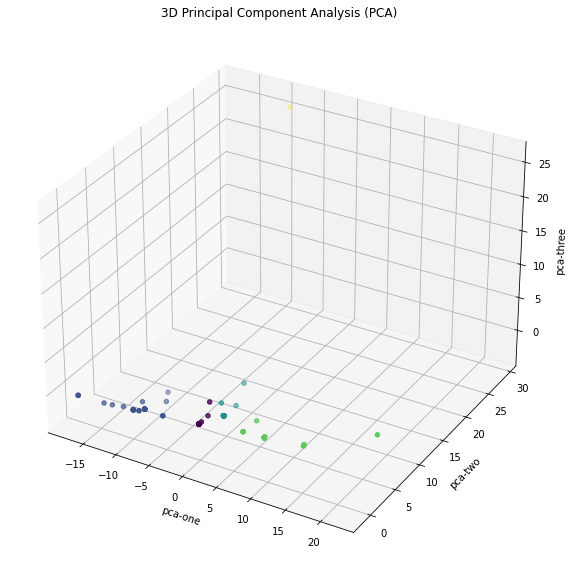

In [72]:
# Visualizing the results of the 3D PCA.
ax = plt.figure(figsize=(10, 10)).gca(projection="3d")
plt.title("3D Principal Component Analysis (PCA)")
ax.scatter(
    xs=pca_i[:, 0], ys=pca_i[:, 1], zs=pca_i[:, 2], c=cluster_image_df["clusters"]
)
ax.set_xlabel("pca-one")
ax.set_ylabel("pca-two")
ax.set_zlabel("pca-three")
plt.show()

**3D interactive visualization for image dataset**

In [73]:
fig = px.scatter_3d(
    pca_i,
    x=pca_i[:, 0],
    y=pca_i[:, 1],
    z=pca_i[:, 2],
    color=cluster_image_df["clusters"],
    opacity=0.1,
)
fig.show()

**Listing out the groups of image_name in different clusters**

In [74]:
df1 = pd.DataFrame([])
global_mean = cluster_image_df.mean().sort_values(ascending=False)


for c in tqdm(range(0, 5)):
    c = cluster_image_df[cluster_image_df.clusters == c].iloc[:, :-1].mean()
    diff = c - global_mean
    d = diff.sort_values(ascending=False).head(20)
    d1 = pd.DataFrame(d).reset_index()
    d1.rename(columns={"index": "image_name"}, inplace=True)
    df1 = df1.append(d1.image_name)
df1 = df1.reset_index()
df1.rename(
    index={
        0: "cluster 1",
        1: "cluster 2",
        2: "cluster 3",
        3: "cluster 4",
        4: "cluster 5",
    },
    inplace=True,
)
df1.drop(columns="index", inplace=True)

df1

100%|██████████| 5/5 [00:00<00:00, 216.83it/s]


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
cluster 1,openshift/ose-cli-artifacts,ubi8/dotnet-50,ubi8/ruby-27,jboss-amq-6/amq63-openshift,openshift/ose-oauth-proxy,3scale-amp2/memcached-rhel7,openshift/ose-cli,3scale-amp2/backend-rhel7,3scale-amp2/zync-rhel7,rhscl/mongodb-36-rhel7,3scale-amp2/system-rhel7,rhscl/redis-32-rhel7,3scale-amp2/apicast-gateway-rhel8,openshift/ose-grafana,rhscl/mysql-57-rhel7,openshift/ose-jenkins,rhel8/httpd-24,rhel8/redis-5,openshift/ose-tests,rhel8/mysql-80
cluster 2,openshift/ose-tools,openshift/ose-must-gather,openshift/ose-tests,openshift/ose-cli,openshift/ose-jenkins,openshift/ose-grafana,openshift/ose-oauth-proxy,openshift/ose-cli-artifacts,jboss-amq-6/amq63-openshift,rhel8/postgresql-12,rhel8/postgresql-10,3scale-amp2/apicast-gateway-rhel8,rhel8/mysql-80,rhel8/httpd-24,rhscl/postgresql-10-rhel7,3scale-amp2/backend-rhel7,rhel8/redis-5,3scale-amp2/system-rhel7,3scale-amp2/zync-rhel7,rhscl/mysql-57-rhel7
cluster 3,rhel8/postgresql-12,rhel8/postgresql-10,rhscl/postgresql-10-rhel7,rhel8/mysql-80,rhel8/redis-5,rhel8/httpd-24,rhscl/mysql-57-rhel7,rhscl/redis-32-rhel7,rhscl/mongodb-36-rhel7,3scale-amp2/apicast-gateway-rhel8,3scale-amp2/system-rhel7,3scale-amp2/zync-rhel7,3scale-amp2/backend-rhel7,3scale-amp2/memcached-rhel7,openshift/ose-tests,openshift/ose-must-gather,openshift/ose-grafana,ubi8/ruby-27,ubi8/dotnet-50,openshift/ose-cli-artifacts
cluster 4,ubi8/ruby-27,ubi8/dotnet-50,rhel8/mysql-80,rhscl/mongodb-36-rhel7,rhscl/mysql-57-rhel7,rhel8/redis-5,rhel8/httpd-24,rhscl/redis-32-rhel7,3scale-amp2/system-rhel7,3scale-amp2/zync-rhel7,3scale-amp2/apicast-gateway-rhel8,rhscl/postgresql-10-rhel7,3scale-amp2/memcached-rhel7,rhel8/postgresql-10,rhel8/postgresql-12,3scale-amp2/backend-rhel7,jboss-amq-6/amq63-openshift,openshift/ose-must-gather,openshift/ose-grafana,openshift/ose-jenkins
cluster 5,3scale-amp2/zync-rhel7,3scale-amp2/system-rhel7,3scale-amp2/backend-rhel7,3scale-amp2/memcached-rhel7,3scale-amp2/apicast-gateway-rhel8,rhscl/mysql-57-rhel7,rhscl/redis-32-rhel7,rhscl/postgresql-10-rhel7,rhscl/mongodb-36-rhel7,jboss-amq-6/amq63-openshift,rhel8/postgresql-10,rhel8/postgresql-12,rhel8/mysql-80,rhel8/redis-5,rhel8/httpd-24,openshift/ose-must-gather,openshift/ose-tests,openshift/ose-cli,openshift/ose-cli-artifacts,openshift/ose-grafana


We generated the above dataframe by differencitating the global mean with the mean of the individual cluster, represented as a index in the dataframe. Each row in the dataframe df1, represents groups of top 20 image_names having a higher probability of occuring/running for the same user.

# Implementing KMeans for `container dataset`

We take the number of clusters = 3. Because of the large number of unique features, the program will be computationally intensive. We apply KMeans algorithm by selecting 10 clusters.

In [75]:
kmeans = KMeans(n_clusters=3, random_state=2)
kmeans = kmeans.fit(X_cont)
clusters = kmeans.predict(X_cont)

In [76]:
clusters

array([1, 1, 0, ..., 1, 1, 2], dtype=int32)

In [77]:
cluster_cont_df = X_cont
cluster_cont_df["clusters"] = clusters

In [78]:
cluster_cont_df.head()

,3scale-amp2/3scale-rhel7-operator,3scale-amp2/apicast-gateway-rhel8,3scale-amp2/backend-rhel7,3scale-amp2/memcached-rhel7,3scale-amp2/system-rhel7,3scale-amp2/zync-rhel7,Calico Operator,Cilium,Cloud Native PostgreSQL Operator,Elastic Cloud on Kubernetes,F5 BIG-IP Controller Operator,NGINX Ingress Operator,NVIDIA GPU Operator,Seldon Operator,alertmanager,amq7/amq-broker-rhel7-operator,amq7/amq-streams-kafka-25-rhel7,amq7/amq-streams-kafka-26-rhel7,amq7/amq-streams-rhel7-operator,amq7/amq-streams-rhel7-operator-metadata,ansible-automation-platform/platform-resource-rhel7-operator,ansible-tower,cephcsi,cert-manager cainjector,cert-manager controller,cert-manager webhook,codeready-workspaces/devfileregistry-rhel8,codeready-workspaces/operator,codeready-workspaces/pluginregistry-rhel8,codeready-workspaces/server-rhel8,collectd-exporter,container-native-virtualization/bridge-marker,container-native-virtualization/cluster-network-addons-operator,container-native-virtualization/cnv-containernetworking-plugins,container-native-virtualization/hostpath-provisioner-rhel8-operator,container-native-virtualization/hyperconverged-cluster-operator,container-native-virtualization/hyperconverged-cluster-webhook-rhel8,container-native-virtualization/kubemacpool,container-native-virtualization/kubernetes-nmstate-handler-rhel8,container-native-virtualization/kubevirt-cpu-model-nfd-plugin,container-native-virtualization/kubevirt-cpu-node-labeller,container-native-virtualization/kubevirt-kvm-info-nfd-plugin,container-native-virtualization/kubevirt-ssp-operator,container-native-virtualization/node-maintenance-operator,container-native-virtualization/ovs-cni-marker,container-native-virtualization/ovs-cni-plugin,container-native-virtualization/virt-api,container-native-virtualization/virt-cdi-apiserver,container-native-virtualization/virt-cdi-controller,container-native-virtualization/virt-cdi-importer,container-native-virtualization/virt-cdi-operator,container-native-virtualization/virt-cdi-uploadproxy,container-native-virtualization/virt-controller,container-native-virtualization/virt-handler,container-native-virtualization/virt-launcher,container-native-virtualization/virt-operator,container-native-virtualization/vm-import-controller-rhel8,container-native-virtualization/vm-import-operator-rhel8,costmanagement-metrics-operator,distributed-tracing/jaeger-rhel8-operator,grafana,ibm common service webhook,ibm-events-operator,ibm-postgresql,jboss-amq-6/amq63-openshift,jboss-eap-7/eap73-rhel8-operator,kube-state-metrics,mcg-core,mcg-operator,mcr.microsoft.com/mssql/rhel8/server,must-gather-service,ocp-tools-4/odo-init-image,ocs-operator,ocs-registry,openshift-compliance-content,openshift-gitops-1-tech-preview/argocd-rhel8,openshift-gitops-1-tech-preview/gitops-rhel8,openshift-gitops-1-tech-preview/gitops-rhel8-operator,openshift-gitops-1-tech-preview/kam-delivery-rhel8,openshift-gitops-1/gitops-rhel8,openshift-gitops-1/kam-delivery-rhel8,openshift-logging/cluster-logging-operator-bundle,openshift-logging/cluster-logging-rhel8-operator,openshift-logging/elasticsearch-operator-bundle,openshift-logging/elasticsearch-proxy-rhel8,openshift-logging/elasticsearch-rhel8-operator,openshift-logging/elasticsearch6-rhel8,openshift-logging/fluentd-rhel8,openshift-logging/kibana6-rhel8,openshift-pipelines-tech-preview/pipelines-controller-rhel8,openshift-pipelines-tech-preview/pipelines-operator-proxy-rhel8,openshift-pipelines-tech-preview/pipelines-rhel8-operator,openshift-pipelines-tech-preview/pipelines-triggers-controller-rhel8,openshift-pipelines-tech-preview/pipelines-triggers-webhook-rhel8,openshift-pipelines-tech-preview/pipelines-webhook-rhel8,openshift-pipelines/pipelines-controller-rhel8,openshift-pipelines/pipelines-operator-proxy-rhel8,openshift-pipelines/pipelines-rhel8-operator,openshift-pipelines/pipelines-triggers-controller-rhel8,openshift-pipelines/pipelines-triggers-core-interceptors-rhel8,openshift-pipelines/pipelines-triggers-eventlistenersink-rh

**Visualizing the results of the 3D PCA**

In [79]:
pca_c = pca3.fit_transform(cluster_cont_df)

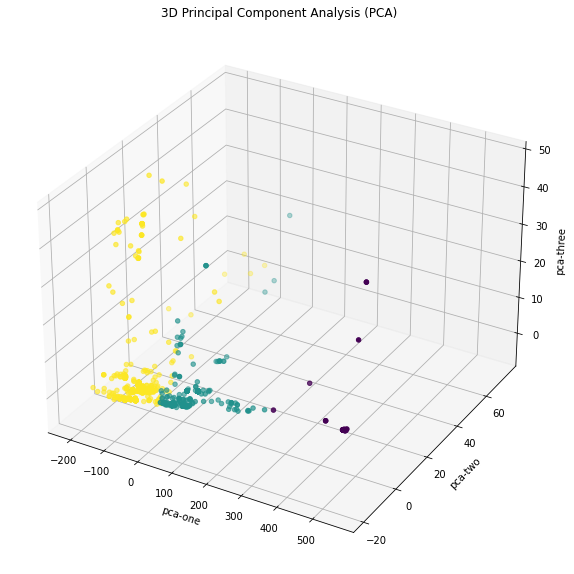

In [80]:
# Visualizing the results of the 3D PCA.
ax = plt.figure(figsize=(10, 10)).gca(projection="3d")
plt.title("3D Principal Component Analysis (PCA)")
ax.scatter(
    xs=pca_c[:, 0], ys=pca_c[:, 1], zs=pca_c[:, 2], c=cluster_cont_df["clusters"]
)
ax.set_xlabel("pca-one")
ax.set_ylabel("pca-two")
ax.set_zlabel("pca-three")
plt.show()

**3D interactive visualization for image dataset**

In [81]:
fig = px.scatter_3d(
    pca_c,
    x=pca_c[:, 0],
    y=pca_c[:, 1],
    z=pca_c[:, 2],
    color=cluster_cont_df["clusters"],
    opacity=0.1,
)
fig.show()

**Listing out the groups of image_name in different clusters**

In [82]:
df1 = pd.DataFrame([])
global_mean = cluster_cont_df.mean().sort_values(ascending=False)


for c in tqdm(range(0, 3)):
    c = cluster_cont_df[cluster_cont_df.clusters == c].iloc[:, :-1].mean()
    diff = c - global_mean
    d = diff.sort_values(ascending=False).head(20)
    d1 = pd.DataFrame(d).reset_index()
    d1.rename(columns={"index": "image_name"}, inplace=True)
    df1 = df1.append(d1.image_name)
df1 = df1.reset_index()
df1.rename(index={0: "cluster 1", 1: "cluster 2", 2: "cluster 3"}, inplace=True)
df1.drop(columns="index", inplace=True)

df1

100%|██████████| 3/3 [00:00<00:00, 141.29it/s]


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
cluster 1,Cilium,ubi8/ruby-27,cephcsi,ubi8,rhel8/mysql-80,rhel8/httpd-24,ubi8/ubi8-init,ubi8/dotnet-50,rhceph,rhel8/redis-5,rhscl/mysql-57-rhel7,grafana,rhscl/mongodb-36-rhel7,rook-ceph,rhscl/redis-32-rhel7,amq7/amq-streams-kafka-26-rhel7,amq7/amq-streams-kafka-25-rhel7,mcg-core,rhacm2/grafana,rhacm2/grc-ui-rhel8
cluster 2,rhacm2/registration-rhel8,rhacm2/work-rhel8,rhacm2/multicloud-manager-rhel8,rhacm2/multiclusterhub-rhel8,rhacm2/registration-rhel8-operator,rhacm2/grc-ui-rhel8,rhacm2/redisgraph-tls-rhel8,rhacm2/multiclusterhub-repo-rhel8,rhacm2/application-ui-rhel8,rhacm2/search-rhel8,rhacm2/grafana,rhacm2/thanos-rhel7,rhacm2/grc-ui-api-rhel8,rhacm2/search-ui-rhel8,rhacm2/rcm-controller-rhel8,rhacm2/console-rhel8,rhacm2/search-aggregator-rhel8,rhacm2/submariner-addon-rhel8,rhacm2/prometheus-alertmanager-rhel8,rhacm2/managedcluster-import-controller-rhel8
cluster 3,openshift/ose-kube-rbac-proxy,openshift/ose-cli,openshift/ose-ironic,openshift/ose-ptp,openshift/ose-sdn,openshift/ose-etcd,openshift/ose-coredns,openshift/ose-tests,openshift/ose-oauth-proxy,openshift/ose-tools,openshift/ose-console,openshift/ose-machine-api-operator,openshift/ose-hyperkube,openshift/ose-ptp-operator,openshift/ose-installer,openshift/ose-thanos,openshift/ose-kuryr-cni,openshift/ose-telemeter,openshift/ose-deployer,openshift/ose-prometheus


We generated the above dataframe by differencitating the global mean with the mean of the individual cluster, represented as a index in the dataframe. Each row in the dataframe df1, represents groups of top 20 image_names having a higher probability of occuring/running for the same user.

---

# KMeans clustering by similarity encoders: (Not Taking frequency into considerations)

**Encoding image layer dataset**

In this issue, we are applying the encoding for the `image_name` from the dataset. Similar to previous approach, we encoded the image_name with respect to the `cluster_id`.

In [83]:
df_image.drop_duplicates(inplace=True)
df_image_name = df_image[["name"]].reindex()
enc = SimilarityEncoder(similarity="ngram")
X_enc = enc.fit_transform(df_image_name)
X_image_name = pd.DataFrame(X_enc)
X_image_name.columns = sorted(df_image_name.name.unique())
X_image = pd.concat([df_image["cluster_id"], X_image_name], axis=1)
X_image = X_image.set_index("cluster_id")
X_image = X_image.groupby(level=0).sum()

In [84]:
X_image.head()

,3scale-amp2/apicast-gateway-rhel8,3scale-amp2/backend-rhel7,3scale-amp2/memcached-rhel7,3scale-amp2/system-rhel7,3scale-amp2/zync-rhel7,jboss-amq-6/amq63-openshift,openshift/ose-cli,openshift/ose-cli-artifacts,openshift/ose-grafana,openshift/ose-jenkins,openshift/ose-must-gather,openshift/ose-oauth-proxy,openshift/ose-tests,openshift/ose-tools,rhel8/httpd-24,rhel8/mysql-80,rhel8/postgresql-10,rhel8/postgresql-12,rhel8/redis-5,rhscl/mongodb-36-rhel7,rhscl/mysql-57-rhel7,rhscl/postgresql-10-rhel7,rhscl/redis-32-rhel7,ubi8/dotnet-50,ubi8/ruby-27
cluster_id,,,,,,,,,,,,,,,,,,,,,,,,,
00003d61-9db1-4757-9cd1-84df271daeb9,0.011236,0.026316,0.018868,0.013245,0.013793,0.165468,0.571429,1.0,0.384615,0.384615,0.333333,0.333333,0.4375,0.408163,0.0,0.0,0.007299,0.007299,0.0,0.006849,0.007143,0.012987,0.007143,0.0,0.0
00351e6e-53ce-465e-9493-cf0cd2367049,0.011236,0.026316,0.018868,0.013245,0.013793,0.165468,0.571429,1.0,0.384615,0.384615,0.333333,0.333333,0.4375,0.408163,0.0,0.0,0.007299,0.007299,0.0,0.006849,0.007143,0.012987,0.007143,0.0,0.0
003ba133-e754-4d5a-bc57-675b386d1f05,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0
00479ead-b7fc-49c2-ae20-3990a9b3d08c,0.011236,0.026316,0.018868,0.013245,0.013793,0.165468,0.571429,1.0,0.384615,0.384615,0.333333,0.333333,0.4375,0.408163,0.0,0.0,0.007299,0.007299,0.0,0.006849,0.007143,0.012987,0.007143,0.0,0.0
00748c32-15c3-4586-98fb-e5078ca9f3b8,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0


In [85]:
X_image.shape

(1810, 25)

1810 rows corresponds to 1810 cluster_id. 

**Encoding container dataset**

In [86]:
df_cont.drop_duplicates(inplace=True)
df_cont_name = df_cont[["name"]].reindex()
enc = SimilarityEncoder(similarity="ngram")
X_enc = enc.fit_transform(df_cont_name)
X_cont_name = pd.DataFrame(X_enc)
X_cont_name.columns = sorted(df_cont_name.name.unique())
X_cont = pd.concat([df_cont["cluster_id"], X_cont_name], axis=1)
X_cont = X_cont.set_index("cluster_id")
X_cont = X_cont.groupby(level=0).sum()

In [87]:
X_cont.head()

,3scale-amp2/3scale-rhel7-operator,3scale-amp2/apicast-gateway-rhel8,3scale-amp2/backend-rhel7,3scale-amp2/memcached-rhel7,3scale-amp2/system-rhel7,3scale-amp2/zync-rhel7,Calico Operator,Cilium,Cloud Native PostgreSQL Operator,Elastic Cloud on Kubernetes,F5 BIG-IP Controller Operator,NGINX Ingress Operator,NVIDIA GPU Operator,Seldon Operator,alertmanager,amq7/amq-broker-rhel7-operator,amq7/amq-streams-kafka-25-rhel7,amq7/amq-streams-kafka-26-rhel7,amq7/amq-streams-rhel7-operator,amq7/amq-streams-rhel7-operator-metadata,ansible-automation-platform/platform-resource-rhel7-operator,ansible-tower,cephcsi,cert-manager cainjector,cert-manager controller,cert-manager webhook,codeready-workspaces/devfileregistry-rhel8,codeready-workspaces/operator,codeready-workspaces/pluginregistry-rhel8,codeready-workspaces/server-rhel8,collectd-exporter,container-native-virtualization/bridge-marker,container-native-virtualization/cluster-network-addons-operator,container-native-virtualization/cnv-containernetworking-plugins,container-native-virtualization/hostpath-provisioner-rhel8-operator,container-native-virtualization/hyperconverged-cluster-operator,container-native-virtualization/hyperconverged-cluster-webhook-rhel8,container-native-virtualization/kubemacpool,container-native-virtualization/kubernetes-nmstate-handler-rhel8,container-native-virtualization/kubevirt-cpu-model-nfd-plugin,container-native-virtualization/kubevirt-cpu-node-labeller,container-native-virtualization/kubevirt-kvm-info-nfd-plugin,container-native-virtualization/kubevirt-ssp-operator,container-native-virtualization/node-maintenance-operator,container-native-virtualization/ovs-cni-marker,container-native-virtualization/ovs-cni-plugin,container-native-virtualization/virt-api,container-native-virtualization/virt-cdi-apiserver,container-native-virtualization/virt-cdi-controller,container-native-virtualization/virt-cdi-importer,container-native-virtualization/virt-cdi-operator,container-native-virtualization/virt-cdi-uploadproxy,container-native-virtualization/virt-controller,container-native-virtualization/virt-handler,container-native-virtualization/virt-launcher,container-native-virtualization/virt-operator,container-native-virtualization/vm-import-controller-rhel8,container-native-virtualization/vm-import-operator-rhel8,costmanagement-metrics-operator,distributed-tracing/jaeger-rhel8-operator,grafana,ibm common service webhook,ibm-events-operator,ibm-postgresql,jboss-amq-6/amq63-openshift,jboss-eap-7/eap73-rhel8-operator,kube-state-metrics,mcg-core,mcg-operator,mcr.microsoft.com/mssql/rhel8/server,must-gather-service,ocp-tools-4/odo-init-image,ocs-operator,ocs-registry,openshift-compliance-content,openshift-gitops-1-tech-preview/argocd-rhel8,openshift-gitops-1-tech-preview/gitops-rhel8,openshift-gitops-1-tech-preview/gitops-rhel8-operator,openshift-gitops-1-tech-preview/kam-delivery-rhel8,openshift-gitops-1/gitops-rhel8,openshift-gitops-1/kam-delivery-rhel8,openshift-logging/cluster-logging-operator-bundle,openshift-logging/cluster-logging-rhel8-operator,openshift-logging/elasticsearch-operator-bundle,openshift-logging/elasticsearch-proxy-rhel8,openshift-logging/elasticsearch-rhel8-operator,openshift-logging/elasticsearch6-rhel8,openshift-logging/fluentd-rhel8,openshift-logging/kibana6-rhel8,openshift-pipelines-tech-preview/pipelines-controller-rhel8,openshift-pipelines-tech-preview/pipelines-operator-proxy-rhel8,openshift-pipelines-tech-preview/pipelines-rhel8-operator,openshift-pipelines-tech-preview/pipelines-triggers-controller-rhel8,openshift-pipelines-tech-preview/pipelines-triggers-webhook-rhel8,openshift-pipelines-tech-preview/pipelines-webhook-rhel8,openshift-pipelines/pipelines-controller-rhel8,openshift-pipelines/pipelines-operator-proxy-rhel8,openshift-pipelines/pipelines-rhel8-operator,openshift-pipelines/pipelines-triggers-controller-rhel8,openshift-pipelines/pipelines-triggers-core-interceptors-rhel8,openshift-pipelines/pipelines-triggers-eventlistenersink-rh

In [88]:
X_cont.shape

(1881, 353)

1881 rows corresponds to 1881 cluster_id.

**3D plot for image_layer_dataset**

In [89]:
pca3 = PCA(n_components=3)
pc3 = pca3.fit_transform(X_image)

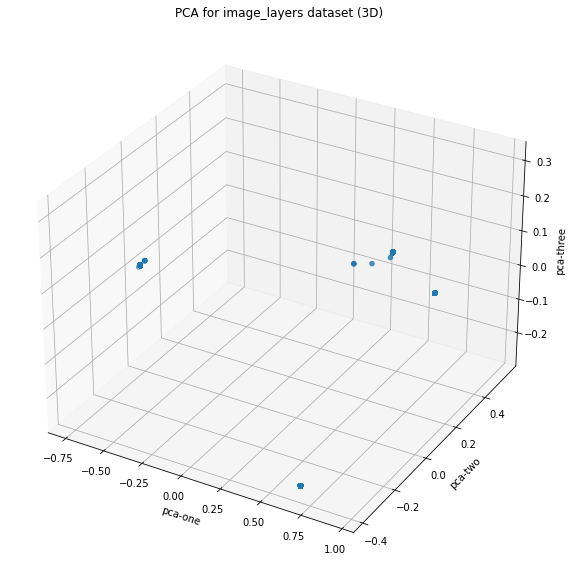

In [90]:
# Visualizing the results of the 3D PCA.
ax = plt.figure(figsize=(10, 10)).gca(projection="3d")
plt.title("3D Principal Component Analysis (PCA)")
ax.scatter(
    xs=pc3[:, 0],
    ys=pc3[:, 1],
    zs=pc3[:, 2],
)
ax.set_xlabel("pca-one")
ax.set_ylabel("pca-two")
ax.set_zlabel("pca-three")
plt.title("PCA for image_layers dataset (3D)")
plt.show()

**3D interactive visualization for image dataset**

In [91]:
fig = px.scatter_3d(pc3, x=pc3[:, 0], y=pc3[:, 1], z=pc3[:, 2], opacity=0.5)
fig.show()

**3D principal component analysis for container dataset**

In [92]:
pcc3 = pca3.fit_transform(X_cont)

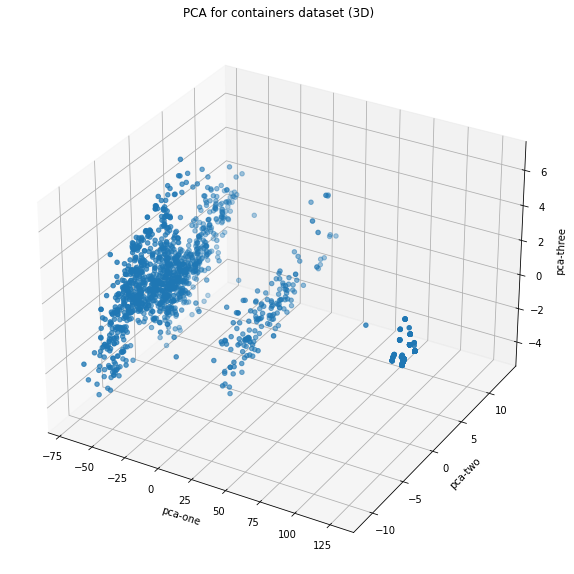

In [93]:
# Visualizing the results of the 3D PCA.
ax = plt.figure(figsize=(10, 10)).gca(projection="3d")
plt.title("3D Principal Component Analysis (PCA)")
ax.scatter(
    xs=pcc3[:, 0],
    ys=pcc3[:, 1],
    zs=pcc3[:, 2],
)
ax.set_xlabel("pca-one")
ax.set_ylabel("pca-two")
ax.set_zlabel("pca-three")
plt.title("PCA for containers dataset (3D)")
plt.show()

**3D interactive visualization**

In [94]:
fig = px.scatter_3d(pcc3, x=pcc3[:, 0], y=pcc3[:, 1], z=pcc3[:, 2], opacity=1)
fig.show()

Now that we have visualized both image_layer dataset and container dataset in both 2D and 3D. We now implement `Kmeans` to identify different clusters in the set.

Before applying KMeans by inserting the number of clusters, we first find the optimal number of clusters in the dataset by using the Elbow method.

# **The Elbow Method**

Applying the elbow method for the image layer dataset, we set the range of cluster from 1 - 10. 

In [95]:
# How to find the best number of clusters?

no_of_clusters = range(1, 10)
inertia = []

for f in tqdm(no_of_clusters):
    kmeans = KMeans(n_clusters=f, random_state=2)
    kmeans = kmeans.fit(X_image)
    u = kmeans.inertia_
    inertia.append(u)

100%|██████████| 9/9 [00:07<00:00,  1.20it/s]


**Inertia vs Number of cluster plot**

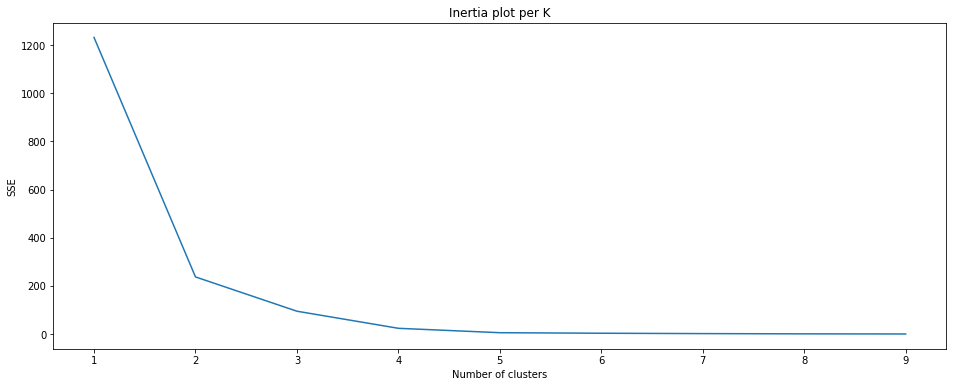

In [96]:
fig, (ax1) = plt.subplots(1, figsize=(16, 6))
xx = np.arange(len(no_of_clusters))
ax1.plot(xx, inertia)
ax1.set_xticks(xx)
ax1.set_xticklabels(no_of_clusters, rotation="horizontal")
plt.xlabel("Number of clusters")
plt.ylabel("SSE")
plt.title("Inertia plot per K")
plt.show()

We see that the optimal number of clusters for image_layer dataset is 4. 

Now checking for the **containers dataset**.

In [97]:
# How to find the best number of clusters?

no_of_clusters = range(1, 10)
inertia = []

for f in tqdm(no_of_clusters):
    kmeans = KMeans(n_clusters=f, random_state=2)
    kmeans = kmeans.fit(X_cont)
    u = kmeans.inertia_
    inertia.append(u)

100%|██████████| 9/9 [00:21<00:00,  2.34s/it]


Text(0.5, 1.0, 'Inertia plot per K')

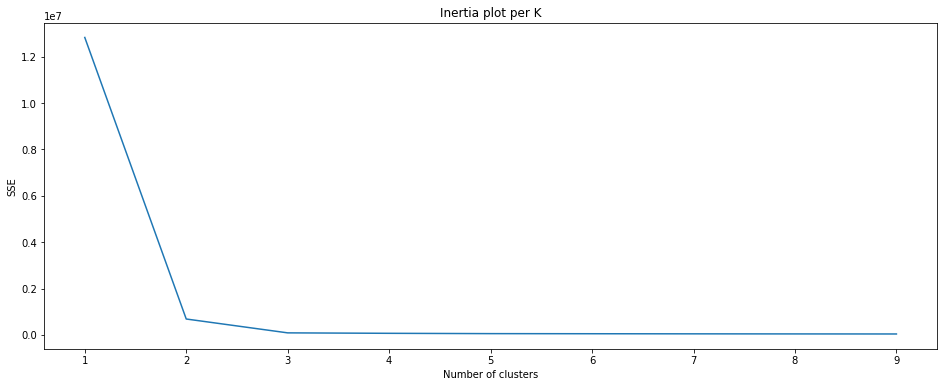

In [98]:
fig, (ax1) = plt.subplots(1, figsize=(16, 6))
xx = np.arange(len(no_of_clusters))
ax1.plot(xx, inertia)
ax1.set_xticks(xx)
ax1.set_xticklabels(no_of_clusters, rotation="horizontal")
plt.xlabel("Number of clusters")
plt.ylabel("SSE")
plt.title("Inertia plot per K")

Optimal number of clusters for container dataset: 3

**Encoding container dataset**

# Implementing KMeans for `image_layer_dataset`

We take the number of clusters = 4 and apply the KMeans algorithm.

In [99]:
kmeans = KMeans(n_clusters=4, random_state=2)
kmeans = kmeans.fit(X_image)
clusters = kmeans.predict(X_image)

In [100]:
clusters

array([1, 1, 0, ..., 0, 0, 0], dtype=int32)

In [101]:
cluster_image_df = X_image
cluster_image_df["clusters"] = clusters

In [102]:
cluster_image_df.head()

,3scale-amp2/apicast-gateway-rhel8,3scale-amp2/backend-rhel7,3scale-amp2/memcached-rhel7,3scale-amp2/system-rhel7,3scale-amp2/zync-rhel7,jboss-amq-6/amq63-openshift,openshift/ose-cli,openshift/ose-cli-artifacts,openshift/ose-grafana,openshift/ose-jenkins,openshift/ose-must-gather,openshift/ose-oauth-proxy,openshift/ose-tests,openshift/ose-tools,rhel8/httpd-24,rhel8/mysql-80,rhel8/postgresql-10,rhel8/postgresql-12,rhel8/redis-5,rhscl/mongodb-36-rhel7,rhscl/mysql-57-rhel7,rhscl/postgresql-10-rhel7,rhscl/redis-32-rhel7,ubi8/dotnet-50,ubi8/ruby-27,clusters
cluster_id,,,,,,,,,,,,,,,,,,,,,,,,,,
00003d61-9db1-4757-9cd1-84df271daeb9,0.011236,0.026316,0.018868,0.013245,0.013793,0.165468,0.571429,1.0,0.384615,0.384615,0.333333,0.333333,0.4375,0.408163,0.0,0.0,0.007299,0.007299,0.0,0.006849,0.007143,0.012987,0.007143,0.0,0.0,1
00351e6e-53ce-465e-9493-cf0cd2367049,0.011236,0.026316,0.018868,0.013245,0.013793,0.165468,0.571429,1.0,0.384615,0.384615,0.333333,0.333333,0.4375,0.408163,0.0,0.0,0.007299,0.007299,0.0,0.006849,0.007143,0.012987,0.007143,0.0,0.0,1
003ba133-e754-4d5a-bc57-675b386d1f05,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0
00479ead-b7fc-49c2-ae20-3990a9b3d08c,0.011236,0.026316,0.018868,0.013245,0.013793,0.165468,0.571429,1.0,0.384615,0.384615,0.333333,0.333333,0.4375,0.408163,0.0,0.0,0.007299,0.007299,0.0,0.006849,0.007143,0.012987,0.007143,0.0,0.0,1
00748c32-15c3-4586-98fb-e5078ca9f3b8,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0


**Visualizing the results of the 3D PCA**

In [103]:
pca_i = pca3.fit_transform(cluster_image_df)

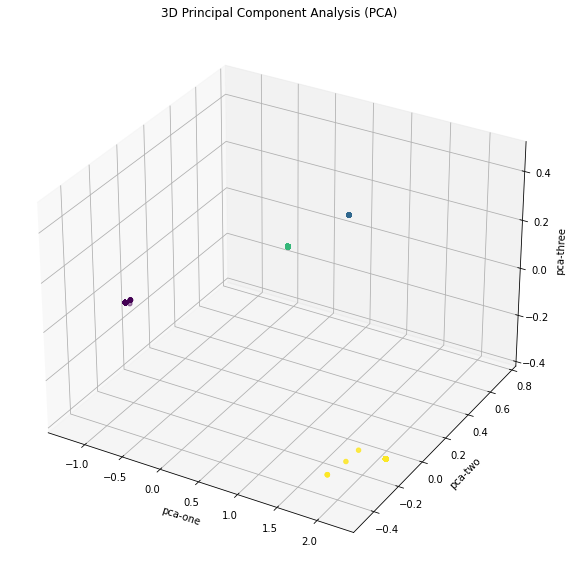

In [104]:
# Visualizing the results of the 3D PCA.
ax = plt.figure(figsize=(10, 10)).gca(projection="3d")
plt.title("3D Principal Component Analysis (PCA)")
ax.scatter(
    xs=pca_i[:, 0], ys=pca_i[:, 1], zs=pca_i[:, 2], c=cluster_image_df["clusters"]
)
ax.set_xlabel("pca-one")
ax.set_ylabel("pca-two")
ax.set_zlabel("pca-three")
plt.show()

**3D interactive visualization for image dataset**

In [105]:
fig = px.scatter_3d(
    pca_i,
    x=pca_i[:, 0],
    y=pca_i[:, 1],
    z=pca_i[:, 2],
    color=cluster_image_df["clusters"],
    opacity=0.1,
)
fig.show()

**Listing out the groups of image_name in different clusters**

In [106]:
df1 = pd.DataFrame([])
global_mean = cluster_image_df.mean().sort_values(ascending=False)


for c in tqdm(range(0, 4)):
    c = cluster_image_df[cluster_image_df.clusters == c].iloc[:, :-1].mean()
    diff = c - global_mean
    d = diff.sort_values(ascending=False).head(20)
    d1 = pd.DataFrame(d).reset_index()
    d1.rename(columns={"index": "image_name"}, inplace=True)
    df1 = df1.append(d1.image_name)
df1 = df1.reset_index()
df1.rename(
    index={0: "cluster 1", 1: "cluster 2", 2: "cluster 3", 3: "cluster 4"}, inplace=True
)
df1.drop(columns="index", inplace=True)

df1

100%|██████████| 4/4 [00:00<00:00, 197.65it/s]


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
cluster 1,rhel8/mysql-80,rhel8/redis-5,rhel8/postgresql-12,rhel8/httpd-24,ubi8/dotnet-50,ubi8/ruby-27,rhel8/postgresql-10,rhscl/redis-32-rhel7,rhscl/mysql-57-rhel7,rhscl/mongodb-36-rhel7,rhscl/postgresql-10-rhel7,3scale-amp2/apicast-gateway-rhel8,3scale-amp2/system-rhel7,3scale-amp2/zync-rhel7,3scale-amp2/memcached-rhel7,3scale-amp2/backend-rhel7,jboss-amq-6/amq63-openshift,openshift/ose-must-gather,openshift/ose-jenkins,openshift/ose-grafana
cluster 2,openshift/ose-cli-artifacts,openshift/ose-cli,openshift/ose-tests,openshift/ose-tools,openshift/ose-jenkins,openshift/ose-grafana,openshift/ose-must-gather,jboss-amq-6/amq63-openshift,openshift/ose-oauth-proxy,3scale-amp2/backend-rhel7,3scale-amp2/memcached-rhel7,3scale-amp2/zync-rhel7,3scale-amp2/system-rhel7,3scale-amp2/apicast-gateway-rhel8,rhscl/postgresql-10-rhel7,rhscl/mongodb-36-rhel7,rhscl/mysql-57-rhel7,rhscl/redis-32-rhel7,ubi8/ruby-27,ubi8/dotnet-50
cluster 3,openshift/ose-oauth-proxy,openshift/ose-tools,openshift/ose-tests,openshift/ose-jenkins,openshift/ose-grafana,openshift/ose-must-gather,openshift/ose-cli,jboss-amq-6/amq63-openshift,openshift/ose-cli-artifacts,3scale-amp2/backend-rhel7,3scale-amp2/zync-rhel7,3scale-amp2/system-rhel7,3scale-amp2/apicast-gateway-rhel8,3scale-amp2/memcached-rhel7,ubi8/ruby-27,rhel8/postgresql-10,ubi8/dotnet-50,rhel8/httpd-24,rhel8/redis-5,rhel8/mysql-80
cluster 4,openshift/ose-cli,openshift/ose-tools,openshift/ose-tests,openshift/ose-grafana,openshift/ose-jenkins,openshift/ose-must-gather,openshift/ose-cli-artifacts,openshift/ose-oauth-proxy,jboss-amq-6/amq63-openshift,rhscl/postgresql-10-rhel7,3scale-amp2/backend-rhel7,rhscl/mongodb-36-rhel7,rhscl/mysql-57-rhel7,rhscl/redis-32-rhel7,3scale-amp2/zync-rhel7,3scale-amp2/system-rhel7,3scale-amp2/apicast-gateway-rhel8,3scale-amp2/memcached-rhel7,rhel8/postgresql-10,rhel8/postgresql-12


We generated the above dataframe by differencitating the global mean with the mean of the individual cluster, represented as a index in the dataframe. Each row in the dataframe df1, represents groups of top 20 image_names having a higher probability of occuring/running for the same user.

# Implementing KMeans for `container dataset`

We take the number of clusters = 3. Because of the large number of unique features, the program will be computationally intensive. We apply KMeans algorithm by selecting 10 clusters.

In [107]:
kmeans = KMeans(n_clusters=3, random_state=2)
kmeans = kmeans.fit(X_cont)
clusters = kmeans.predict(X_cont)

In [108]:
clusters

array([1, 0, 0, ..., 1, 0, 0], dtype=int32)

In [109]:
cluster_cont_df = X_cont
cluster_cont_df["clusters"] = clusters

In [110]:
cluster_cont_df.head()

,3scale-amp2/3scale-rhel7-operator,3scale-amp2/apicast-gateway-rhel8,3scale-amp2/backend-rhel7,3scale-amp2/memcached-rhel7,3scale-amp2/system-rhel7,3scale-amp2/zync-rhel7,Calico Operator,Cilium,Cloud Native PostgreSQL Operator,Elastic Cloud on Kubernetes,F5 BIG-IP Controller Operator,NGINX Ingress Operator,NVIDIA GPU Operator,Seldon Operator,alertmanager,amq7/amq-broker-rhel7-operator,amq7/amq-streams-kafka-25-rhel7,amq7/amq-streams-kafka-26-rhel7,amq7/amq-streams-rhel7-operator,amq7/amq-streams-rhel7-operator-metadata,ansible-automation-platform/platform-resource-rhel7-operator,ansible-tower,cephcsi,cert-manager cainjector,cert-manager controller,cert-manager webhook,codeready-workspaces/devfileregistry-rhel8,codeready-workspaces/operator,codeready-workspaces/pluginregistry-rhel8,codeready-workspaces/server-rhel8,collectd-exporter,container-native-virtualization/bridge-marker,container-native-virtualization/cluster-network-addons-operator,container-native-virtualization/cnv-containernetworking-plugins,container-native-virtualization/hostpath-provisioner-rhel8-operator,container-native-virtualization/hyperconverged-cluster-operator,container-native-virtualization/hyperconverged-cluster-webhook-rhel8,container-native-virtualization/kubemacpool,container-native-virtualization/kubernetes-nmstate-handler-rhel8,container-native-virtualization/kubevirt-cpu-model-nfd-plugin,container-native-virtualization/kubevirt-cpu-node-labeller,container-native-virtualization/kubevirt-kvm-info-nfd-plugin,container-native-virtualization/kubevirt-ssp-operator,container-native-virtualization/node-maintenance-operator,container-native-virtualization/ovs-cni-marker,container-native-virtualization/ovs-cni-plugin,container-native-virtualization/virt-api,container-native-virtualization/virt-cdi-apiserver,container-native-virtualization/virt-cdi-controller,container-native-virtualization/virt-cdi-importer,container-native-virtualization/virt-cdi-operator,container-native-virtualization/virt-cdi-uploadproxy,container-native-virtualization/virt-controller,container-native-virtualization/virt-handler,container-native-virtualization/virt-launcher,container-native-virtualization/virt-operator,container-native-virtualization/vm-import-controller-rhel8,container-native-virtualization/vm-import-operator-rhel8,costmanagement-metrics-operator,distributed-tracing/jaeger-rhel8-operator,grafana,ibm common service webhook,ibm-events-operator,ibm-postgresql,jboss-amq-6/amq63-openshift,jboss-eap-7/eap73-rhel8-operator,kube-state-metrics,mcg-core,mcg-operator,mcr.microsoft.com/mssql/rhel8/server,must-gather-service,ocp-tools-4/odo-init-image,ocs-operator,ocs-registry,openshift-compliance-content,openshift-gitops-1-tech-preview/argocd-rhel8,openshift-gitops-1-tech-preview/gitops-rhel8,openshift-gitops-1-tech-preview/gitops-rhel8-operator,openshift-gitops-1-tech-preview/kam-delivery-rhel8,openshift-gitops-1/gitops-rhel8,openshift-gitops-1/kam-delivery-rhel8,openshift-logging/cluster-logging-operator-bundle,openshift-logging/cluster-logging-rhel8-operator,openshift-logging/elasticsearch-operator-bundle,openshift-logging/elasticsearch-proxy-rhel8,openshift-logging/elasticsearch-rhel8-operator,openshift-logging/elasticsearch6-rhel8,openshift-logging/fluentd-rhel8,openshift-logging/kibana6-rhel8,openshift-pipelines-tech-preview/pipelines-controller-rhel8,openshift-pipelines-tech-preview/pipelines-operator-proxy-rhel8,openshift-pipelines-tech-preview/pipelines-rhel8-operator,openshift-pipelines-tech-preview/pipelines-triggers-controller-rhel8,openshift-pipelines-tech-preview/pipelines-triggers-webhook-rhel8,openshift-pipelines-tech-preview/pipelines-webhook-rhel8,openshift-pipelines/pipelines-controller-rhel8,openshift-pipelines/pipelines-operator-proxy-rhel8,openshift-pipelines/pipelines-rhel8-operator,openshift-pipelines/pipelines-triggers-controller-rhel8,openshift-pipelines/pipelines-triggers-core-interceptors-rhel8,openshift-pipelines/pipelines-triggers-eventlistenersink-rh

**Visualizing the results of the 3D PCA**

In [111]:
pca_c = pca3.fit_transform(cluster_cont_df)

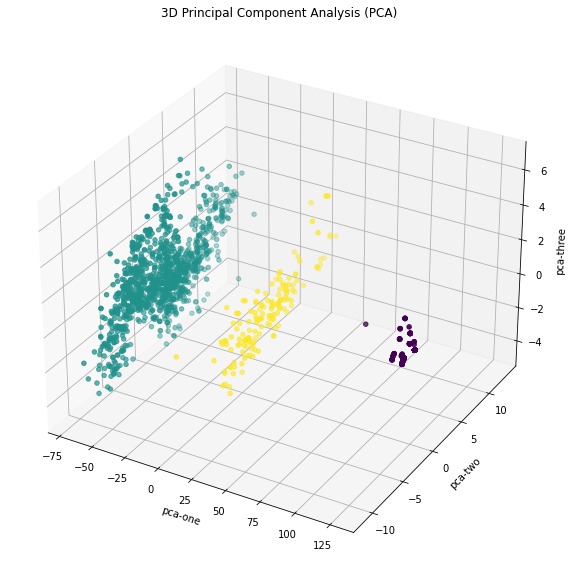

In [112]:
# Visualizing the results of the 3D PCA.
ax = plt.figure(figsize=(10, 10)).gca(projection="3d")
plt.title("3D Principal Component Analysis (PCA)")
ax.scatter(
    xs=pca_c[:, 0], ys=pca_c[:, 1], zs=pca_c[:, 2], c=cluster_cont_df["clusters"]
)
ax.set_xlabel("pca-one")
ax.set_ylabel("pca-two")
ax.set_zlabel("pca-three")
plt.show()

**3D interactive visualization for image dataset**

In [113]:
fig = px.scatter_3d(
    pca_c,
    x=pca_c[:, 0],
    y=pca_c[:, 1],
    z=pca_c[:, 2],
    color=cluster_cont_df["clusters"],
    opacity=0.1,
)
fig.show()

**Listing out the groups of image_name in different clusters**

In [114]:
df1 = pd.DataFrame([])
global_mean = cluster_cont_df.mean().sort_values(ascending=False)


for c in tqdm(range(0, 3)):
    c = cluster_cont_df[cluster_cont_df.clusters == c].iloc[:, :-1].mean()
    diff = c - global_mean
    d = diff.sort_values(ascending=False).head(20)
    d1 = pd.DataFrame(d).reset_index()
    d1.rename(columns={"index": "image_name"}, inplace=True)
    df1 = df1.append(d1.image_name)
df1 = df1.reset_index()
df1.rename(index={0: "cluster 1", 1: "cluster 2", 2: "cluster 3"}, inplace=True)
df1.drop(columns="index", inplace=True)

df1

100%|██████████| 3/3 [00:00<00:00, 125.59it/s]


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
cluster 1,ubi8,ubi8/ruby-27,Cilium,rhceph,cephcsi,ubi8/ubi8-init,ubi8/dotnet-50,rhel8/httpd-24,rhel8/mysql-80,rook-ceph,rhscl/mysql-57-rhel7,rhscl/mongodb-36-rhel7,rhel8/redis-5,amq7/amq-streams-kafka-25-rhel7,amq7/amq-streams-kafka-26-rhel7,rhscl/redis-32-rhel7,grafana,ibm-postgresql,mcg-core,3scale-amp2/zync-rhel7
cluster 2,openshift/ose-cluster-dns-operator,openshift/ose-cluster-nfd-operator,openshift/ose-cluster-etcd-operator,openshift/ose-cluster-config-operator,openshift/ose-cluster-ingress-operator,openshift/ose-cluster-storage-operator,openshift/ose-cluster-samples-operator,openshift/ose-cluster-network-operator,openshift/ose-console-operator,openshift/ose-cluster-logging-operator,openshift/ose-ptp-operator,openshift/ose-cli,openshift/ose-cluster-monitoring-operator,openshift/ose-cluster-baremetal-operator,openshift/ose-prometheus-operator,openshift/ose-cluster-autoscaler-operator,openshift/ose-cluster-node-tuning-operator,openshift/ose-cluster-kube-apiserver-operator,openshift/ose-cluster-image-registry-operator,openshift/ose-insights-operator
cluster 3,openshift/ose-prometheus,kube-state-metrics,grafana,openshift/ose-prometheus-alertmanager,openshift/ose-prometheus-node-exporter,openshift/ose-prom-label-proxy,openshift/ose-k8s-prometheus-adapter,Cilium,rhacm2/grafana,ubi8,rhacm2/prometheus-alertmanager-rhel8,openshift/ose-grafana,ubi8/ruby-27,ubi8/dotnet-50,ubi8/ubi8-init,alertmanager,ibm-postgresql,rhceph,rhacm2/work-rhel8,openshift/ose-kube-state-metrics


We generated the above dataframe by differencitating the global mean with the mean of the individual cluster, represented as a index in the dataframe. Each row in the dataframe df1, represents groups of top 20 image_names having a higher probability of occuring/running for the same user.

# Conclusions

We explored Kmeans clustering by employing two types of encoding techniques, `one hot encoding` and `similarity encoding`. Encoding by similarity is turing out to be better than one hot encoding. Since, one hot encoding treats every variable as an independent one. In this notebook, we explored similarity encoding with respective to cluster_id. There clusters are classified based on their individual names. In our next approach, we plan to link the values extracted from the telemetry with the image_name and find their clusters.